<a href="https://colab.research.google.com/github/Vetair/FoodClassificaton/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download Food Classification dataset from kaggle


In [ ]:
!pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"emilchen","key":"0d264bcaf4869af175abc1208dd7ddcc"}'}

In [ ]:
!mkdir -p ~/.kaggle

!cp kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d harishkumardatalab/food-image-classification-dataset

 99% 1.67G/1.68G [00:11<00:00, 212MB/s]
100% 1.68G/1.68G [00:12<00:00, 142MB/s]


In [ ]:
!unzip food-image-classification-dataset.zip

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: Food Classification dataset/idli/277.jpg  
  inflating: Food Classification dataset/idli/278.jpg  
  inflating: Food Classification dataset/idli/280.jpg  
  inflating: Food Classification dataset/idli/282.jpg  
  inflating: Food Classification dataset/idli/283.jpg  
  inflating: Food Classification dataset/idli/284.jpg  
  inflating: Food Classification dataset/idli/285.jpg  
  inflating: Food Classification dataset/idli/286.jpg  
  inflating: Food Classification dataset/idli/287.jpg  
  inflating: Food Classification dataset/idli/288.jpg  
  inflating: Food Classification dataset/idli/290.jpg  
  inflating: Food Classification dataset/idli/292.jpg  
  inflating: Food Classification dataset/idli/293.jpg  
  inflating: Food Classification dataset/idli/295.jpg  
  inflating: Food Classification dataset/idli/296.jpg  
  inflating: Food Classification dataset/idli/297.jpg  
  inflating: Food Classification dataset/idli/299.jpg  
  inflating: Food Cla

In [ ]:
!unzip Food Backup.zip

unzip:  cannot find or open Food, Food.zip or Food.ZIP.




*   Upload to google drive



In [ ]:
!cp -r /content/Food\ Classification\ dataset /content/drive/MyDrive/Colab\ Notebooks/Projects/datasets

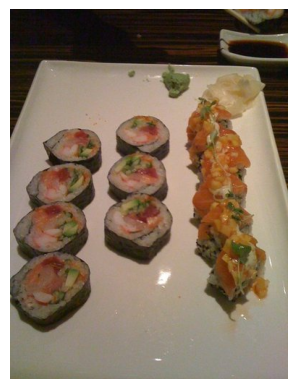

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = '/content/Food Classification dataset/sushi/100332.jpg'

img = mpimg.imread(image_path)

plt.imshow(img)
plt.axis('off')
plt.show()


# Data visualization

In [ ]:
import os
import numpy as np
import pandas as pd
import cv2
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# Specify the dataset path
dataset_path = '/content/Food Classification dataset'
os.chdir(dataset_path)
os.listdir()

['chole_bhature',
 'dal_makhani',
 'Baked Potato',
 'kadai_paneer',
 'momos',
 'pakode',
 'omelette',
 'Taquito',
 'pav_bhaji',
 'jalebi',
 'paani_puri',
 'samosa',
 'kaathi_rolls',
 'chicken_curry',
 'butter_naan',
 'chai',
 'ice_cream',
 'chapati',
 'Fries',
 'kulfi',
 'apple_pie',
 'Crispy Chicken',
 'Donut',
 'Sandwich',
 'pizza',
 'burger',
 'idli',
 'dhokla',
 'masala_dosa',
 'fried_rice',
 'cheesecake',
 'Taco',
 'Hot Dog',
 'sushi']

In [ ]:
import pandas as pd

# Create an empty list to store individual DataFrames
dfs = []

for food in tqdm(os.listdir()): # Iterate through each category
    os.chdir(food)
    category_data = []  # Create a list to store data for each category
    for file in os.listdir(): # Iterate through each image
        try:
            img = cv2.imread(file)
            category_data.append({'Category': food, 'Filename': file, 'Image Width': img.shape[1], 'Image Height': img.shape[0]})
        except:
            print(os.path.join(food, file), 'Read Error')
    category_df = pd.DataFrame(category_data)  # Create a DataFrame for the current category
    dfs.append(category_df)  # Append the DataFrame to the list
    os.chdir('../')

# Concatenate all DataFrames in the list into a single DataFrame
df = pd.concat(dfs, ignore_index=True)


100%|██████████| 34/34 [03:20<00:00,  5.90s/it]


In [ ]:
df

,Category,Filename,Image Width,Image Height
0,chole_bhature,248.jpg,600,800
1,chole_bhature,020.jpg,1024,671
2,chole_bhature,236.jpg,1200,763
3,chole_bhature,014.jpg,451,640
4,chole_bhature,download.jpg,100,100
...,...,...,...,...
23868,sushi,569585.jpg,512,384
23869,sushi,1333369.jpg,512,512
23870,sushi,2031692.jpg,512,384
23871,sushi,105070.jpg,512,384


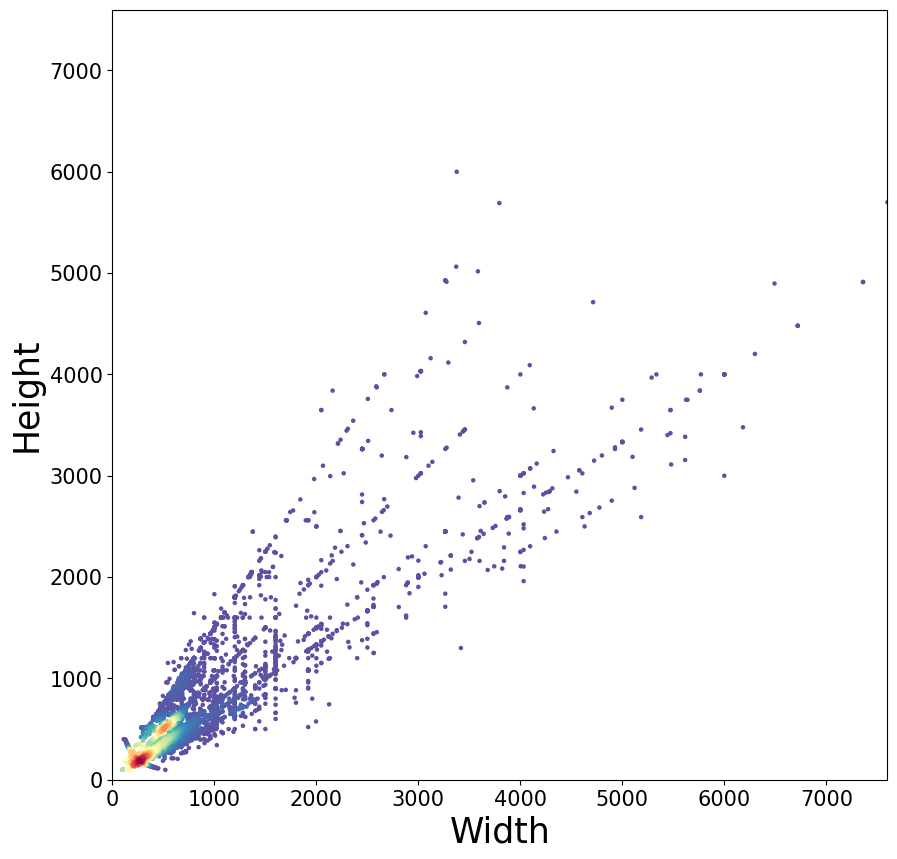

In [ ]:
from scipy.stats import gaussian_kde
from matplotlib.colors import LogNorm

# Extracting image width and height
width = df['Image Width']
height = df['Image Height']

# Calculate density using Gaussian KDE
kde = gaussian_kde([width, height])
density = kde([width, height])

# Sort the points by density
sorted_indices = density.argsort()
width, height, density = width[sorted_indices], height[sorted_indices], density[sorted_indices]

plt.figure(figsize=(10,10))

# Create scatter plot
plt.scatter(width, height, c=density, s=5, cmap='Spectral_r')

plt.tick_params(labelsize=15)

max_dimension = max(max(df['Image Width']), max(df['Image Height']))
plt.xlim(0, max_dimension)
plt.ylim(0, max_dimension)

plt.ylabel('Height', fontsize=25)
plt.xlabel('Width', fontsize=25)

plt.savefig('Image_Size_Distribution.pdf', dpi=120, bbox_inches='tight')

plt.show()

In [ ]:
fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111,  # 类似绘制子图 subplot(111)
                 nrows_ncols=(n, n),  # 创建 n 行 m 列的 axes 网格
                 axes_pad=0.02,  # 网格间距
                 share_all=True
                 )

# 遍历每张图像
for ax, im in zip(grid, images):
    ax.imshow(im)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Split the dataset into a training set and a test set

In [ ]:
import os
import shutil
import random
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid
%matplotlib inline

import numpy as np
import math
import os

import cv2

from tqdm import tqdm

* Get all class names

In [ ]:
# Specify dataset path
dataset_path = '/content/Food Classification dataset'

In [ ]:
dataset_name = dataset_path.split('_')[0]
print('Dataset:', dataset_name)

Dataset: /content/Food Classification dataset


In [ ]:
classes = os.listdir(dataset_path)
len(classes)
classes

['chole_bhature',
 'dal_makhani',
 'Baked Potato',
 'kadai_paneer',
 'momos',
 'pakode',
 'omelette',
 'Taquito',
 'pav_bhaji',
 'jalebi',
 'paani_puri',
 'samosa',
 'kaathi_rolls',
 'chicken_curry',
 'butter_naan',
 'chai',
 'ice_cream',
 'chapati',
 'Fries',
 'kulfi',
 'apple_pie',
 'Crispy Chicken',
 'Donut',
 'Sandwich',
 'pizza',
 'burger',
 'idli',
 'dhokla',
 'masala_dosa',
 'fried_rice',
 'cheesecake',
 'Taco',
 'Hot Dog',
 'sushi']

* Create train and test folders

In [ ]:
os.mkdir(os.path.join(dataset_path, 'train'))
os.mkdir(os.path.join(dataset_path, 'test'))

# Create subfolders for each class in train and test folders
for food in classes:
    os.mkdir(os.path.join(dataset_path, 'train', food))
    os.mkdir(os.path.join(dataset_path, 'test', food))

* Split training sets, test sets, move files

In [ ]:
test_frac = 0.2  # Test set fraction
random.seed(123)  # Random seed for reproducibility

df_list = []  # Create an empty list to store individual DataFrames
print('{:^18} {:^18} {:^18}'.format('Class', 'Trainset Data Count', 'Testset Data Count'))

for food in classes:  # Iterate through each class

    # Reads all image file names for this category
    old_dir = os.path.join(dataset_path, food)
    images_filename = os.listdir(old_dir)
    random.shuffle(images_filename)  # Shuffle images randomly

    # Split datasets
    testset_numer = int(len(images_filename) * test_frac)  # Number of images in test set
    testset_images = images_filename[:testset_numer]  # Images to move to the test directory
    trainset_images = images_filename[testset_numer:]  # Images to move to the train directory

    # Move images to the test directory
    for image in testset_images:
        old_img_path = os.path.join(dataset_path, food, image)
        new_test_path = os.path.join(dataset_path, 'test', food, image)
        shutil.move(old_img_path, new_test_path)

    # Move images to the train directory
    for image in trainset_images:
        old_img_path = os.path.join(dataset_path, food, image)
        new_train_path = os.path.join(dataset_path, 'train', food, image)
        shutil.move(old_img_path, new_train_path)

    #Delete old folders
    assert len(os.listdir(old_dir)) == 0  # Ensure all images in the old folder have been moved
    shutil.rmtree(old_dir)  # Delete the folder

    # print the number of data for each category
    print('{:^18} {:^18} {:^18}'.format(food, len(trainset_images), len(testset_images)))

    df_list.append(pd.DataFrame({'Class': [food], 'Trainset Data Count': [len(trainset_images)], 'Testset Data Count': [len(testset_images)]}))

df = pd.concat(df_list, ignore_index=True)  # Concatenate all DataFrames in the list into a single DataFrame

# Rename the split dataset
shutil.move(dataset_path, dataset_name+'_split')

# Statistical table for dataset categories, exported as csv file
df['Total'] = df['Trainset Data Count'] + df['Testset Data Count']
df.to_csv('Data_Count.csv', index=False)

      Class        Trainset Data Count Testset Data Count
  chole_bhature           301                 75        
   dal_makhani            236                 59        
   Baked Potato           1200               300        
   kadai_paneer           268                 66        
      momos               259                 64        
      pakode              216                 53        
     omelette             800                200        
     Taquito              1200               300        
    pav_bhaji             244                 61        
      jalebi              231                 57        
    paani_puri            116                 28        
      samosa              196                 48        
   kaathi_rolls           224                 55        
  chicken_curry           800                200        
   butter_naan            246                 61        
       chai               276                 68        
    ice_cream             800 

In [ ]:
df

,Class,Trainset Data Count,Testset Data Count,Total
0,chole_bhature,301,75,376
1,dal_makhani,236,59,295
2,Baked Potato,1200,300,1500
3,kadai_paneer,268,66,334
4,momos,259,64,323
5,pakode,216,53,269
6,omelette,800,200,1000
7,Taquito,1200,300,1500
8,pav_bhaji,244,61,305
9,jalebi,231,57,288




*   Visualize images in folders




In [ ]:
folder_path = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train/cheesecake'

In [ ]:
# Number of visualized images
N = 25

In [ ]:
# n rows and n columns
n = math.floor(np.sqrt(N))
n

5

In [ ]:
images = []
for each_img in os.listdir(folder_path)[:N]:
    img_path = os.path.join(folder_path, each_img)
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

In [ ]:
len(images)

25

<ipython-input-48-c642f13a5d9b>:12: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


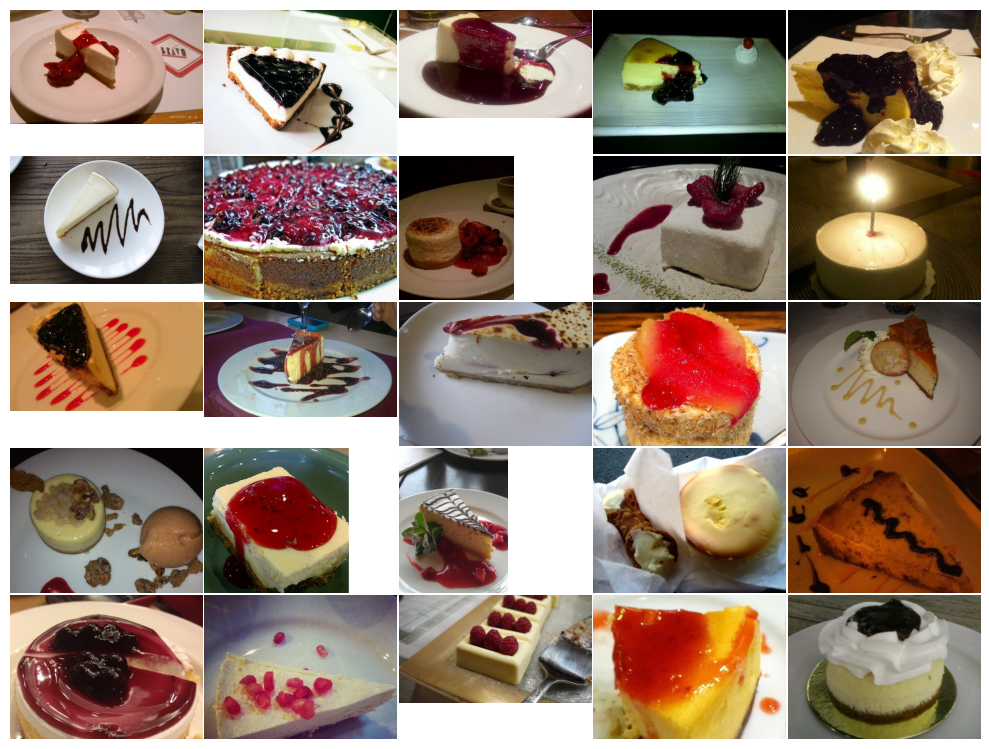

In [ ]:
fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(n, n),
                 axes_pad=0.02,
                 share_all=True
                 )

for ax, im in zip(grid, images):
    ax.imshow(im)
    ax.axis('off')

plt.tight_layout()
plt.show()

* Count the number of images in each category

In [ ]:
df = pd.read_csv('/content/Data_Count.csv')

In [ ]:
df.shape

(5, 4)

In [ ]:
# Specify visualized features
feature = 'Total'


In [ ]:
df = df.sort_values(by=feature, ascending=False)

In [ ]:
df.head()

,Class,Trainset Data Count,Testset Data Count,Total
0,apple_pie,800,200,1000
1,cheesecake,800,200,1000
2,chicken_curry,800,200,1000
3,ice_cream,800,200,1000
4,sushi,800,200,1000


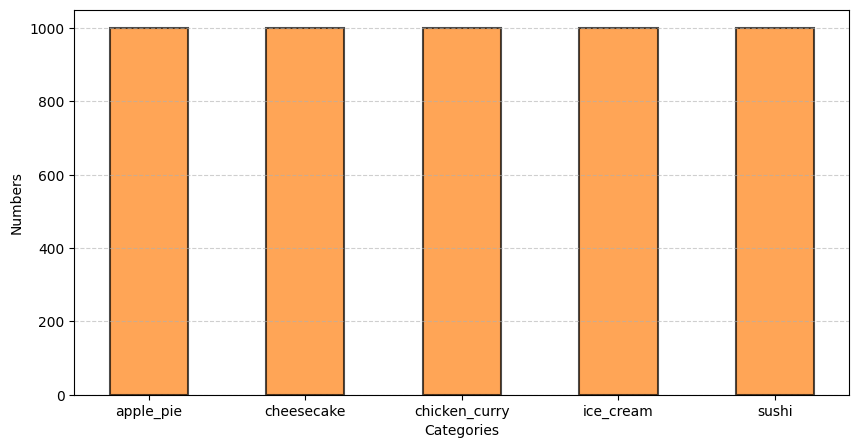

In [ ]:
x = df['Class']
y = df[feature]

plt.figure(figsize=(10, 5))
plt.bar(x, y, facecolor='#ff7f0e', edgecolor='black', linewidth=1.5, alpha=0.7, width=0.5)
plt.xlabel('Categories')
plt.ylabel('Numbers')
plt.grid(True, linestyle='--', alpha=0.6, axis='y')
plt.show()

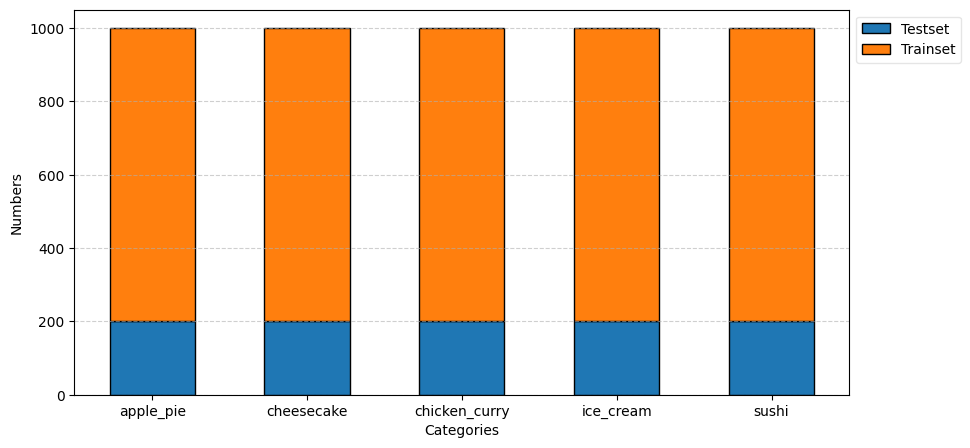

In [ ]:
x = df['Class']
y1 = df['Testset Data Count']
y2 = df['Trainset Data Count']

plt.figure(figsize=(10, 5))

plt.bar(x, y1, width, label='Testset', color='#1f77b4', edgecolor='black')
plt.bar(x, y2, width, label='Trainset', bottom=y1, color='#ff7f0e', edgecolor='black')

plt.xlabel('Categories')
plt.ylabel('Numbers')
plt.grid(True, linestyle='--', alpha=0.6, axis='y')

plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fancybox=True, framealpha=0.5, fontsize=10)

plt.savefig('Number of images in each category.pdf', dpi=120, bbox_inches='tight')

plt.show()

In [ ]:
!dir

Number\ of\ images\ in\ each\ category.pdf  test  train


# Train model

In [ ]:
import os
# Store the output file
os.mkdir('/content/drive/MyDrive/Colab Notebooks/Projects/output')

# Store the trained model weights
os.mkdir('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint')

# Store the generated diagram
os.mkdir('/content/drive/MyDrive/Colab Notebooks/Projects/diagram')

FileExistsError: [Errno 17] File exists: '/content/drive/MyDrive/Colab Notebooks/Projects/output'

In [ ]:
import time
import os
from tqdm import tqdm

import pandas as pd
import numpy as np

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Get computing hardware
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


* Image preprocessing

In [ ]:
from torchvision import transforms

# Training dataset image preprocessing: resizing and cropping, image augmentation, converting to Tensor, normalization
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
# Testing dataset image preprocessing -RCTN: Resizing, cropping, converting to Tensor, normalization
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

* Load datasets

In [ ]:
dataset_dir = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split'

In [ ]:
train_path = os.path.join(dataset_dir, 'train')
test_path = os.path.join(dataset_dir, 'test')
print('Training set path', train_path)
print('Testing set path', test_path)

from torchvision import datasets
# Load the training set
train_dataset = datasets.ImageFolder(train_path, train_transform)
# Load the testing set
test_dataset = datasets.ImageFolder(test_path, test_transform)

print('Number of images in the training set:', len(train_dataset))
print('Number of classes:', len(train_dataset.classes))
print('Class names:', train_dataset.classes)
print('Number of images in the testing set:', len(test_dataset))
print('Number of classes:', len(test_dataset.classes))
print('Class names:', test_dataset.classes)

Training set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train
Testing set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/test
Number of images in the training set: 4000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']
Number of images in the testing set: 1000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']


* Create mappings between the class names and their respective indices in the dataset
* These mappings facilitate the conversion between human-readable class names and their corresponding numerical indices, ensuring seamless handling and interpretation of classes during model training, evaluation, and inference.

In [ ]:
# List of class names
class_names = train_dataset.classes
n_class = len(class_names)
# Mapping: Class to index
class_to_idx = train_dataset.class_to_idx

In [ ]:
# Mapping: Index to class
idx_to_labels = {y: x for x, y in train_dataset.class_to_idx.items()}
idx_to_labels

{0: 'apple_pie',
 1: 'cheesecake',
 2: 'chicken_curry',
 3: 'ice_cream',
 4: 'sushi'}

In [ ]:
# Save as npy file
np.save('/content/drive/MyDrive/Colab Notebooks/Projects/idx_to_labels.npy', idx_to_labels)
np.save('/content/drive/MyDrive/Colab Notebooks/Projects/labels_to_idx.npy', train_dataset.class_to_idx)

* Define a 'DataLoader'

In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

# Data loader for the training set
train_loader = DataLoader(train_dataset,
              batch_size=BATCH_SIZE,
              shuffle=True,
              num_workers=4
              )

# Data loader for the testing set
test_loader = DataLoader(test_dataset,
              batch_size=BATCH_SIZE,
              shuffle=False,
              num_workers=4
              )


* Retrieve a batch of images and their corresponding labels

In [ ]:
images, labels = next(iter(train_loader))

# Print the shape of the batch of images
print(images.shape)

# Print the labels of the batch
print(labels)

torch.Size([32, 3, 224, 224])
tensor([0, 3, 2, 0, 2, 2, 1, 4, 2, 2, 3, 2, 1, 1, 2, 2, 0, 0, 0, 1, 2, 1, 0, 1,
        0, 4, 1, 2, 2, 2, 3, 3])


In [ ]:
# Visualize a batch of images and their labels
# Convert Tensor tensors from the dataset to numpy arrays
images = images.numpy()

In [ ]:
# Check the shape of a single image
print(images[4].shape)

(3, 224, 224)


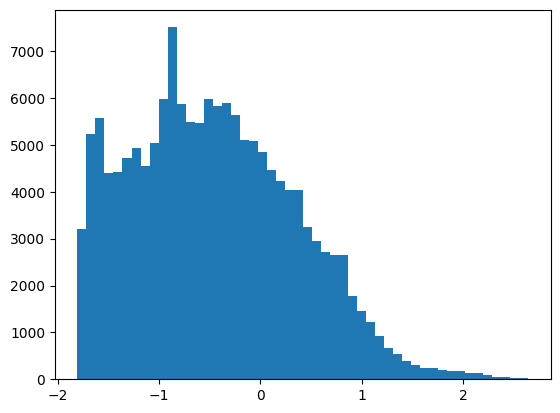

In [ ]:
# Display a histogram of pixel values in a single image
plt.hist(images[4].flatten(), bins=50)
plt.show()

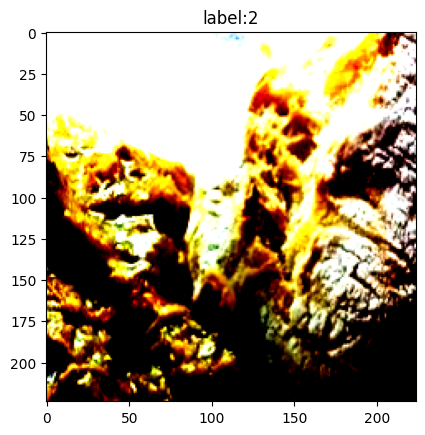

In [ ]:
# Display preprocessed images from the batch
idx = 2
# Displaying an image after transposing the dimensions to (224, 224, 3)
plt.imshow(images[idx].transpose((1, 2, 0)))  # Convert to (224, 224, 3)
plt.title('label:' + str(labels[idx].item()))
plt.show()

In [ ]:
label = labels[idx].item()
label

2

In [ ]:
pred_classname = idx_to_labels[label]
pred_classname

'chicken_curry'

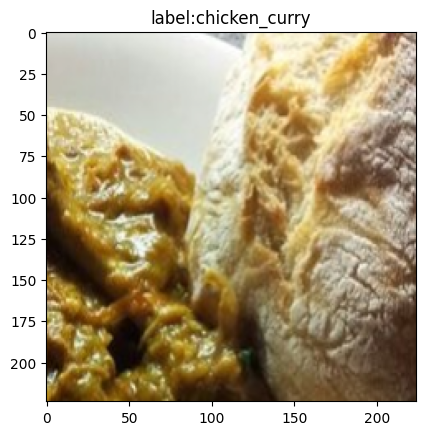

In [ ]:
# Displaying the original image
idx = 2
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
plt.imshow(np.clip(images[idx].transpose((1, 2, 0)) * std + mean, 0, 1))
plt.title('label:' + pred_classname)
plt.show()

# Transfer learning

In [ ]:
from torchvision import models
import torch.optim as optim
from torchsummary import summary

In [ ]:
model = models.resnet18(pretrained=True) # Load the pre-trained model

model.fc = nn.Linear(model.fc.in_features, n_class)

optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, n_class)
model = model.to(device)

# 将输入数据移到GPU上以匹配模型的设备
input_data = torch.randn((1, 3, 224, 224)).to(device)

# 使用摘要函数打印模型结构
summary(model, input_data.shape[1:], device=str(device))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

* Training configuration

In [ ]:
model = models.resnet18(pretrained=True)

In [ ]:
model.fc = nn.Linear(model.fc.in_features, n_class)
model.fc

Linear(in_features=512, out_features=5, bias=True)

In [ ]:
optimizer = optim.Adam(model.fc.parameters())

In [ ]:
# Transfer the model to the specified device (e.g., GPU if available)
model = model.to(device)

# Define the cross-entropy loss function
criterion = nn.CrossEntropyLoss()

# Learning rate adjustment strategy
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

# Number of training epochs
EPOCHS = 20

* Simulate a batch of training

In [ ]:
# Get a batch of data and labels
images, labels = next(iter(train_loader))
images = images.to(device)
labels = labels.to(device)

In [ ]:
# Input the batch to the model, perform forward pass prediction
outputs = model(images)

In [ ]:
# Get the predicted class scores (logits) for all images in the current batch
outputs.shape

torch.Size([32, 5])

In [ ]:
# Calculate the average cross-entropy loss for each sample in the current batch using logits
loss = criterion(outputs, labels)

In [ ]:
# Backpropagation steps
optimizer.zero_grad()  # Clear gradients
loss.backward()  # Backpropagation
optimizer.step()  # Optimizer update

In [ ]:
# Get the predicted classes for all images in the current batch
_, preds = torch.max(outputs, 1)

In [ ]:
preds

tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 3, 0, 0, 0, 3, 0, 0, 3, 1, 0, 0,
        0, 0, 0, 0, 3, 3, 0, 0], device='cuda:0')

In [ ]:
labels

tensor([2, 4, 2, 3, 3, 1, 0, 2, 1, 3, 3, 0, 4, 4, 4, 0, 0, 3, 0, 1, 0, 2, 2, 0,
        1, 4, 2, 1, 4, 1, 4, 1], device='cuda:0')

* Training model

In [ ]:
# Iterate through each epoch
for epoch in tqdm(range(EPOCHS)):

    model.train()  # Set the model to training mode

    for images, labels in train_loader:  # Get a batch containing data and labels from the training set
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)       # Perform forward pass to get predictions for the current batch
        loss = criterion(outputs, labels)  # Calculate the cross-entropy loss for the current batch by comparing predictions with labels

        optimizer.zero_grad() # Clear previously computed gradients
        loss.backward()    # Backpropagate the loss to compute gradients of neural network weights
        optimizer.step()   # Update neural network weights using optimization algorithm

100%|██████████| 20/20 [17:45<00:00, 53.29s/it]


* Test

In [ ]:
model.eval()  # Set the model to evaluation mode
with torch.no_grad():  # Disable gradient calculation

    correct = 0
    total = 0

    for images, labels in tqdm(test_loader):  # Get a batch containing data and labels from the test set
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)  # Perform forward pass to get predictions (confidence) for the current batch
        _, preds = torch.max(outputs, 1)  # Get the predicted class with the highest confidence as the prediction
        total += labels.size(0)
        correct += (preds == labels).sum()  # Count correctly predicted samples

    accuracy = 100 * correct / total
    print('Accuracy on the test set: {:.3f} %'.format(accuracy))


100%|██████████| 32/32 [02:55<00:00,  5.47s/it]

Accuracy on the test set: 82.500 %


Epoch [1/50], Train Loss: 1.1504, Test Loss: 1.0250, Train Accuracy: 56.15%, Test Accuracy: 64.00%
Epoch [2/50], Train Loss: 0.8978, Test Loss: 0.9731, Train Accuracy: 67.28%, Test Accuracy: 65.80%
Epoch [3/50], Train Loss: 0.8327, Test Loss: 0.8929, Train Accuracy: 69.62%, Test Accuracy: 69.70%
Epoch [4/50], Train Loss: 0.7825, Test Loss: 1.2180, Train Accuracy: 71.53%, Test Accuracy: 63.30%
Epoch [5/50], Train Loss: 0.7603, Test Loss: 0.7401, Train Accuracy: 72.50%, Test Accuracy: 74.00%
Epoch [6/50], Train Loss: 0.7418, Test Loss: 0.7973, Train Accuracy: 72.88%, Test Accuracy: 70.10%
Epoch [7/50], Train Loss: 0.7203, Test Loss: 0.6597, Train Accuracy: 73.83%, Test Accuracy: 76.20%
Epoch [8/50], Train Loss: 0.6829, Test Loss: 0.6981, Train Accuracy: 75.25%, Test Accuracy: 75.40%
Epoch [9/50], Train Loss: 0.6781, Test Loss: 0.6638, Train Accuracy: 75.65%, Test Accuracy: 76.20%
Epoch [10/50], Train Loss: 0.6578, Test Loss: 0.5932, Train Accuracy: 76.20%, Test Accuracy: 80.10%
Epoch [11

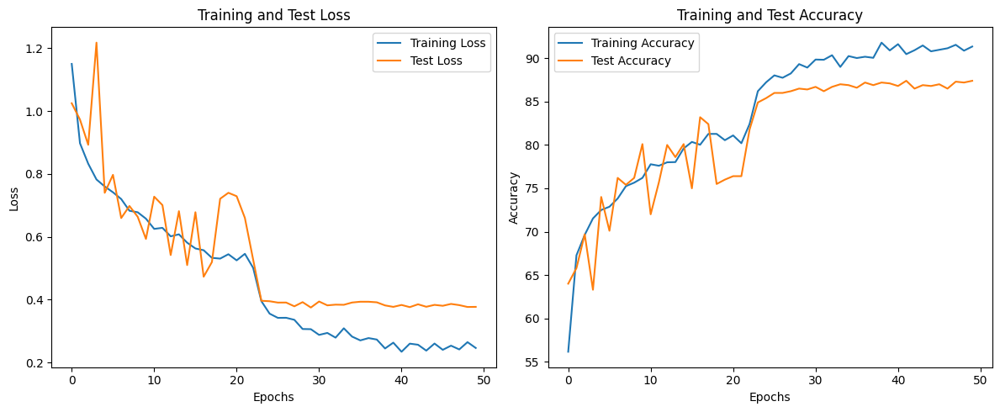

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Number of training epochs
EPOCHS = 50

train_losses = []  # List to store training losses
test_losses = []  # List to store test losses
train_accuracies = []  # List to store training accuracies
test_accuracies = []  # List to store test accuracies

for epoch in range(EPOCHS):
    model.train()  # Set the model to training mode
    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)

    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Testing the model
    model.eval()
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

        epoch_test_loss = running_test_loss / len(test_loader)
        test_losses.append(epoch_test_loss)

        test_accuracy = 100 * correct_test / total_test
        test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    scheduler.step(epoch_test_loss)

# Plotting loss and accuracy graphs
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


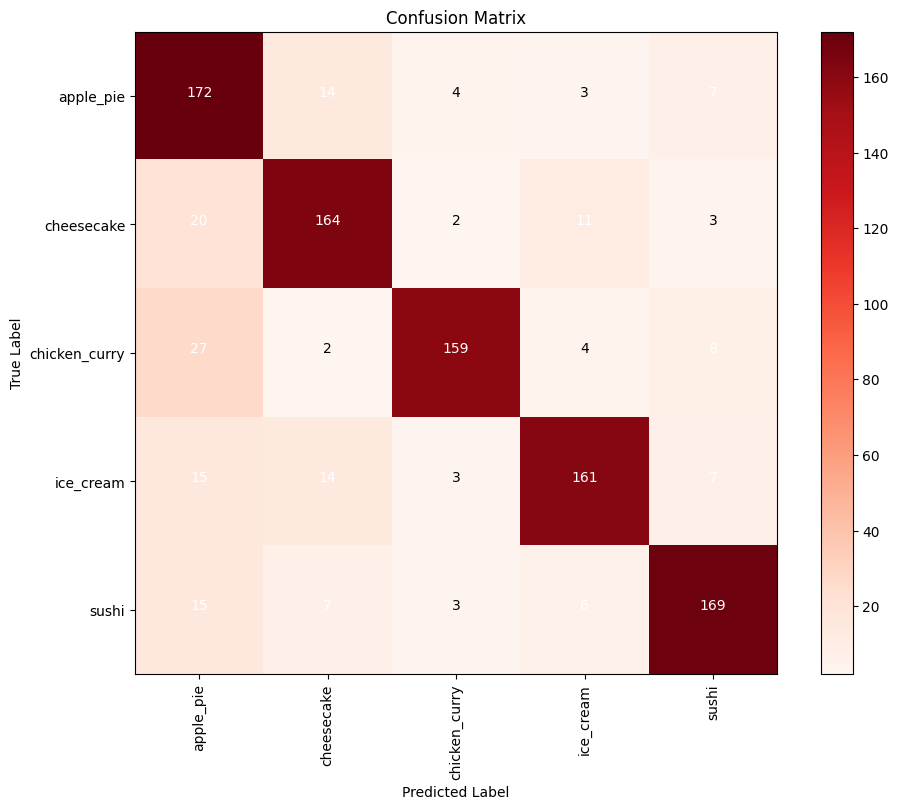

In [ ]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, test_loader, class_names):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            _, preds = torch.max(outputs, 1)  # Get predicted classes
            all_preds.extend(preds.cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    cm = confusion_matrix(all_labels, all_preds)  # Calculate confusion matrix

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap='Reds')
    plt.colorbar()

    ticks = np.arange(len(class_names))
    plt.xticks(ticks, class_names, rotation=90)
    plt.yticks(ticks, class_names)

    plt.title('Confusion Matrix')

    threshold = 4
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:,}".format(cm[i, j]),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > threshold else 'black')

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

# Assuming you have a list of class names for your dataset
class_names = train_dataset.classes

# Usage: pass your PyTorch model and the test_loader to generate the confusion matrix
plot_confusion_matrix(model, test_loader, class_names)
plt.show()

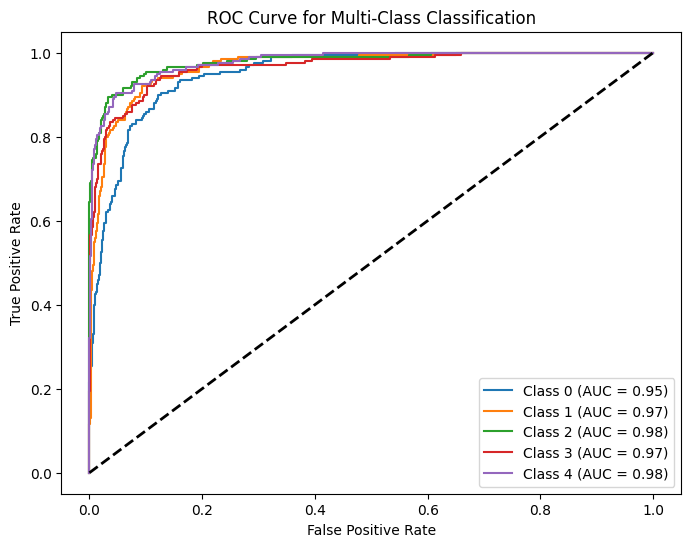

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import torch
num_classes = 5;

def generate_roc_curve(model, test_loader, num_classes):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class Classification')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `test_loader` previously
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, test_loader, and number of classes to generate ROC curves
generate_roc_curve(model, test_loader, num_classes)


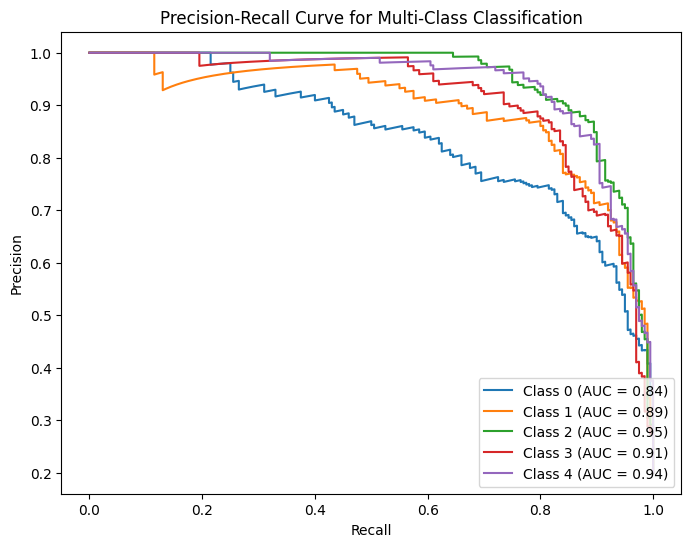

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc
from sklearn.preprocessing import label_binarize
import torch

def generate_precision_recall_curve(model, test_loader, num_classes):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute precision and recall for each class
    precision = dict()
    recall = dict()
    pr_auc = dict()

    for i in range(num_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_true_one_hot[:, i], y_pred[:, i])
        pr_auc[i] = auc(recall[i], precision[i])

    # Plot Precision-Recall curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(recall[i], precision[i], label=f'Class {i} (AUC = {pr_auc[i]:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve for Multi-Class Classification')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `test_loader` previously
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, test_loader, and number of classes to generate Precision-Recall curves
generate_precision_recall_curve(model, test_loader, num_classes)


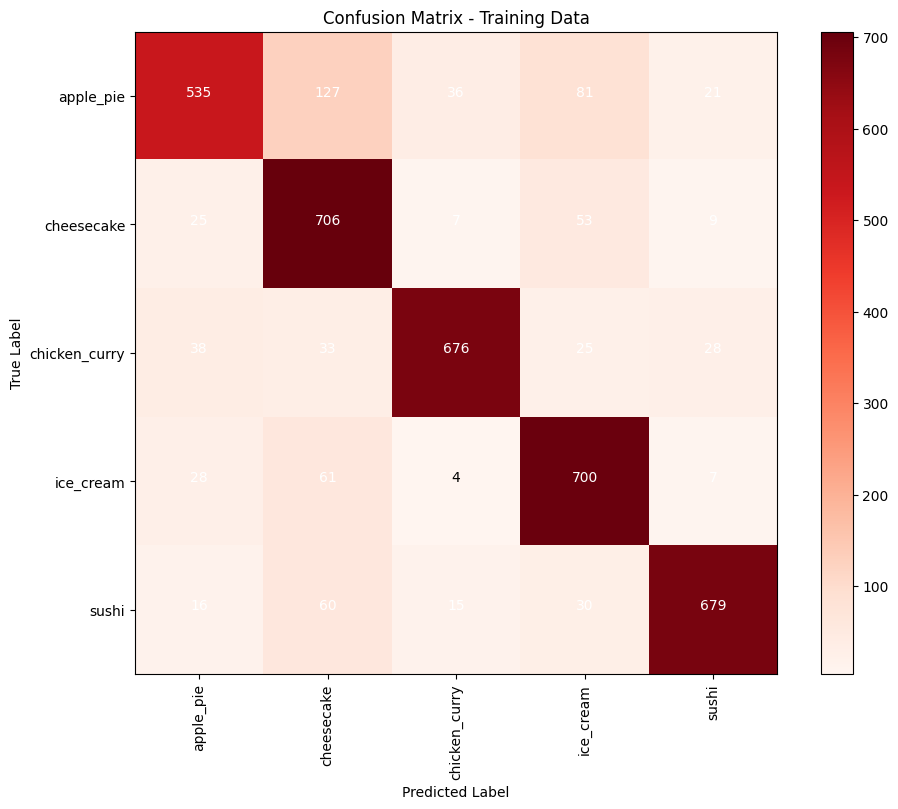

In [ ]:
def plot_confusion_matrix_train(model, train_loader, class_names):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            _, preds = torch.max(outputs, 1)  # Get predicted classes
            all_preds.extend(preds.cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    cm = confusion_matrix(all_labels, all_preds)  # Calculate confusion matrix

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap='Reds')
    plt.colorbar()

    ticks = np.arange(len(class_names))
    plt.xticks(ticks, class_names, rotation=90)
    plt.yticks(ticks, class_names)

    plt.title('Confusion Matrix - Training Data')

    threshold = 4
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:,}".format(cm[i, j]),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > threshold else 'black')

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

# Assuming you have a list of class names for your dataset
class_names = train_dataset.classes

# Assuming you have a train_loader for the training data
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Usage: pass your PyTorch model and the train_loader to generate the confusion matrix for training data
plot_confusion_matrix_train(model, train_loader, class_names)
plt.show()


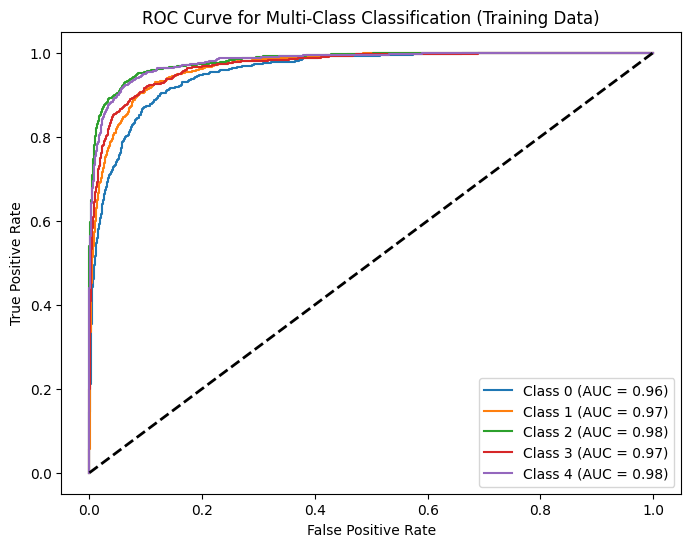

In [ ]:
def generate_roc_curve_train(model, train_loader, num_classes):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class Classification (Training Data)')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `train_loader` for the training data
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, train_loader, and number of classes to generate ROC curves for training data
generate_roc_curve_train(model, train_loader, num_classes)


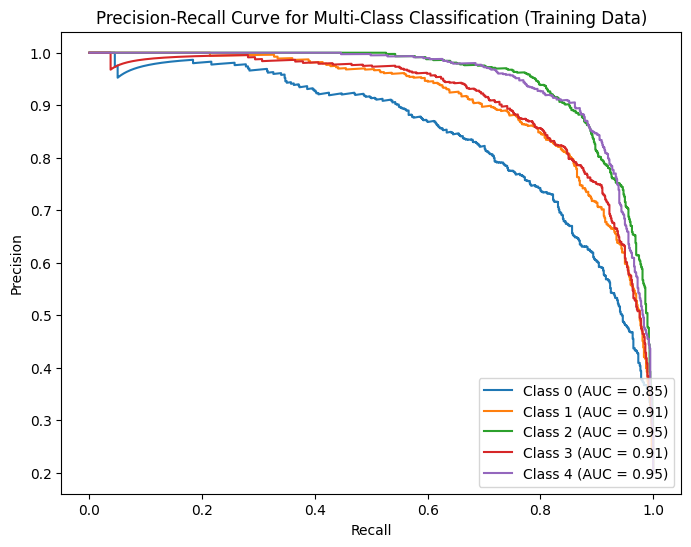

In [ ]:
def generate_precision_recall_curve_train(model, train_loader, num_classes):
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute precision and recall for each class
    precision = dict()
    recall = dict()
    pr_auc = dict()

    for i in range(num_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_true_one_hot[:, i], y_pred[:, i])
        pr_auc[i] = auc(recall[i], precision[i])

    # Plot Precision-Recall curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(recall[i], precision[i], label=f'Class {i} (AUC = {pr_auc[i]:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve for Multi-Class Classification (Training Data)')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `train_loader` for the training data
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, train_loader, and number of classes to generate Precision-Recall curves for training data
generate_precision_recall_curve_train(model, train_loader, num_classes)


In [ ]:
torch.save(model, '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/resnet_18_model.pth')

# MobileNetV2

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
             ReLU6-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
             ReLU6-6         [-1, 32, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             512
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 96, 112, 112]           1,536
      BatchNorm2d-11         [-1, 96, 112, 112]             192
            ReLU6-12         [-1, 96, 112, 112]               0
           Conv2d-13           [-1, 96, 56, 56]             864
      BatchNorm2d-14           [-1, 96,

  2%|▏         | 1/50 [00:49<40:31, 49.61s/it]

Epoch [1/50], Train Loss: 0.9222, Test Loss: 0.6679, Train Accuracy: 66.20%, Test Accuracy: 75.30%


  4%|▍         | 2/50 [01:29<35:14, 44.05s/it]

Epoch [2/50], Train Loss: 0.7043, Test Loss: 0.6091, Train Accuracy: 74.80%, Test Accuracy: 79.00%


  6%|▌         | 3/50 [02:11<33:48, 43.16s/it]

Epoch [3/50], Train Loss: 0.6814, Test Loss: 0.6586, Train Accuracy: 75.62%, Test Accuracy: 75.30%


  8%|▊         | 4/50 [02:51<32:00, 41.75s/it]

Epoch [4/50], Train Loss: 0.6211, Test Loss: 0.6128, Train Accuracy: 77.72%, Test Accuracy: 78.10%


 10%|█         | 5/50 [03:30<30:34, 40.76s/it]

Epoch [5/50], Train Loss: 0.6255, Test Loss: 0.5021, Train Accuracy: 78.25%, Test Accuracy: 82.50%


 12%|█▏        | 6/50 [04:10<29:47, 40.64s/it]

Epoch [6/50], Train Loss: 0.5510, Test Loss: 0.4958, Train Accuracy: 80.00%, Test Accuracy: 82.40%


 14%|█▍        | 7/50 [04:53<29:29, 41.14s/it]

Epoch [7/50], Train Loss: 0.5312, Test Loss: 0.4406, Train Accuracy: 81.33%, Test Accuracy: 85.50%


 16%|█▌        | 8/50 [05:33<28:38, 40.92s/it]

Epoch [8/50], Train Loss: 0.5135, Test Loss: 0.5967, Train Accuracy: 81.80%, Test Accuracy: 77.70%


 18%|█▊        | 9/50 [06:13<27:50, 40.74s/it]

Epoch [9/50], Train Loss: 0.5198, Test Loss: 0.4502, Train Accuracy: 80.92%, Test Accuracy: 83.70%


 20%|██        | 10/50 [06:56<27:37, 41.43s/it]

Epoch [10/50], Train Loss: 0.4654, Test Loss: 0.4782, Train Accuracy: 83.67%, Test Accuracy: 84.10%


 22%|██▏       | 11/50 [07:36<26:36, 40.94s/it]

Epoch [11/50], Train Loss: 0.4910, Test Loss: 0.4744, Train Accuracy: 82.85%, Test Accuracy: 84.10%


 24%|██▍       | 12/50 [08:16<25:41, 40.57s/it]

Epoch [12/50], Train Loss: 0.4864, Test Loss: 0.4167, Train Accuracy: 83.08%, Test Accuracy: 85.10%


 26%|██▌       | 13/50 [08:56<24:51, 40.31s/it]

Epoch [13/50], Train Loss: 0.4496, Test Loss: 0.5360, Train Accuracy: 84.00%, Test Accuracy: 81.80%


 28%|██▊       | 14/50 [09:38<24:35, 40.97s/it]

Epoch [14/50], Train Loss: 0.4677, Test Loss: 0.4277, Train Accuracy: 83.38%, Test Accuracy: 85.10%


 30%|███       | 15/50 [10:19<23:53, 40.94s/it]

Epoch [15/50], Train Loss: 0.4265, Test Loss: 0.4780, Train Accuracy: 84.78%, Test Accuracy: 83.80%


 32%|███▏      | 16/50 [10:59<23:01, 40.63s/it]

Epoch [16/50], Train Loss: 0.4478, Test Loss: 0.4125, Train Accuracy: 83.50%, Test Accuracy: 85.10%


 34%|███▍      | 17/50 [11:38<22:07, 40.24s/it]

Epoch [17/50], Train Loss: 0.4107, Test Loss: 0.4857, Train Accuracy: 85.40%, Test Accuracy: 83.20%


 36%|███▌      | 18/50 [12:20<21:41, 40.68s/it]

Epoch [18/50], Train Loss: 0.4222, Test Loss: 0.5091, Train Accuracy: 85.12%, Test Accuracy: 83.50%


 38%|███▊      | 19/50 [13:00<20:52, 40.42s/it]

Epoch [19/50], Train Loss: 0.4007, Test Loss: 0.4834, Train Accuracy: 85.92%, Test Accuracy: 84.00%


 40%|████      | 20/50 [13:41<20:16, 40.54s/it]

Epoch [20/50], Train Loss: 0.3994, Test Loss: 0.4451, Train Accuracy: 86.65%, Test Accuracy: 85.30%


 40%|████      | 20/50 [14:22<21:34, 43.14s/it]

Epoch [21/50], Train Loss: 0.3985, Test Loss: 0.5316, Train Accuracy: 86.03%, Test Accuracy: 82.80%
Early stopping triggered!


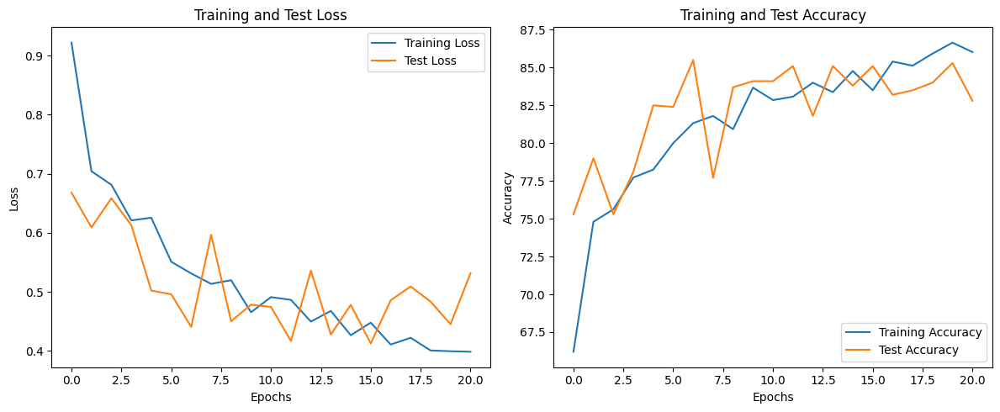

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
from torchsummary import summary
from tqdm import tqdm
import matplotlib.pyplot as plt

# Define the number of classes
n_class = 5

# Define the MobileNetV2-based model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.mobilenetv2 = models.mobilenet_v2(pretrained=True)
        in_features = self.mobilenetv2.classifier[1].in_features
        self.mobilenetv2.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.mobilenetv2(x)

# Set up data transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load the training and testing sets
train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Instantiate the MobileNetV2 model
mobile_net_v2_model = MobileNetV2Model(num_classes=n_class)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobile_net_v2_model = mobile_net_v2_model.to(device)

# Print the model summary
summary(mobile_net_v2_model, input_size=(3, 224, 224), device=str(device))

# Define the optimizer and loss function
optimizer_mobile_net = optim.Adam(mobile_net_v2_model.parameters())
criterion_mobile_net = nn.CrossEntropyLoss()

# Number of training epochs
EPOCHS_MOBILE_NET = 50

train_losses = []  # List to store training losses
test_losses = []   # List to store testing losses
train_accuracies = []  # List to store training accuracies
test_accuracies = []   # List to store testing accuracies

best_test_loss = float('inf')  # Initialize with a very large value
early_stop_patience = 5  # Patience for early stopping
counter = 0  # Counter for early stopping

# Training loop for MobileNetV2
for epoch in tqdm(range(EPOCHS_MOBILE_NET)):
    mobile_net_v2_model.train()
    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer_mobile_net.zero_grad()
        outputs = mobile_net_v2_model(images)
        loss = criterion_mobile_net(outputs, labels)
        loss.backward()
        optimizer_mobile_net.step()

        running_train_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)

    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Testing the model
    mobile_net_v2_model.eval()
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = mobile_net_v2_model(images)
            loss = criterion_mobile_net(outputs, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

        epoch_test_loss = running_test_loss / len(test_loader)
        test_losses.append(epoch_test_loss)

        test_accuracy = 100 * correct_test / total_test
        test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS_MOBILE_NET}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # Early stopping
    if epoch_test_loss < best_test_loss:
        best_test_loss = epoch_test_loss
        counter = 0
    else:
        counter += 1
        if counter >= early_stop_patience:
            print("Early stopping triggered!")
            break

# Plotting loss and accuracy graphs
plt.figure(figsize=(12, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
from torchsummary import summary
from tqdm import tqdm

# Define the number of classes
n_class = 5

# Define the MobileNetV2-based model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.mobilenetv2 = models.mobilenet_v2(pretrained=True)
        in_features = self.mobilenetv2.classifier[1].in_features
        self.mobilenetv2.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.mobilenetv2(x)

# Set up data transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load the training and testing sets
train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Instantiate the MobileNetV2 model
mobile_net_v2_model = MobileNetV2Model(num_classes=n_class)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobile_net_v2_model = mobile_net_v2_model.to(device)

# Print the model summary
summary(mobile_net_v2_model, input_size=(3, 224, 224), device=str(device))

# Define the optimizer and loss function
optimizer_mobile_net = optim.Adam(mobile_net_v2_model.parameters())
criterion_mobile_net = nn.CrossEntropyLoss()

# Number of training epochs
EPOCHS_MOBILE_NET = 20

# Training loop for MobileNetV2
for epoch in tqdm(range(EPOCHS_MOBILE_NET)):
    mobile_net_v2_model.train()

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer_mobile_net.zero_grad()
        outputs = mobile_net_v2_model(images)
        loss = criterion_mobile_net(outputs, labels)
        loss.backward()
        optimizer_mobile_net.step()

# Evaluation on the test set
mobile_net_v2_model.eval()
correct_mobile_net = 0
total_mobile_net = 0

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = mobile_net_v2_model(images)
        _, preds = torch.max(outputs, 1)
        total_mobile_net += labels.size(0)
        correct_mobile_net += (preds == labels).sum().item()

accuracy_mobile_net = correct_mobile_net / total_mobile_net * 100
print('MobileNetV2 Accuracy on the test set: {:.2f}%'.format(accuracy_mobile_net))

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 104MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
             ReLU6-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
             ReLU6-6         [-1, 32, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             512
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 96, 112, 112]           1,536
      BatchNorm2d-11         [-1, 96, 112, 112]             192
            ReLU6-12         [-1, 96, 112, 112]               0
           Conv2d-13           [-1, 96, 56, 56]             864
      BatchNorm2d-14           [-1, 96,

100%|██████████| 20/20 [12:34<00:00, 37.71s/it]


MobileNetV2 Accuracy on the test set: 87.60%


In [ ]:
# Save trained MobileNetV2 model
torch.save(mobile_net_v2_model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/mobile_net_v2_model.pth')

In [ ]:
# Load trained MobileNetV2 model
loaded_mobile_net_v2_model = MobileNetV2Model(num_classes=5)
loaded_mobile_net_v2_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/mobile_net_v2_model.pth'))
loaded_mobile_net_v2_model.eval()

# InceptionV3

In [ ]:
import time
import os
from tqdm import tqdm

import pandas as pd
import numpy as np

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from torchvision import transforms

# Training dataset image preprocessing: resizing and cropping, image augmentation, converting to Tensor, normalization
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
# Testing dataset image preprocessing -RCTN: Resizing, cropping, converting to Tensor, normalization
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])
dataset_dir = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split'
train_path = os.path.join(dataset_dir, 'train')
test_path = os.path.join(dataset_dir, 'test')
print('Training set path', train_path)
print('Testing set path', test_path)

from torchvision import datasets
# Load the training set
train_dataset = datasets.ImageFolder(train_path, train_transform)
# Load the testing set
test_dataset = datasets.ImageFolder(test_path, test_transform)

print('Number of images in the training set:', len(train_dataset))
print('Number of classes:', len(train_dataset.classes))
print('Class names:', train_dataset.classes)
print('Number of images in the testing set:', len(test_dataset))
print('Number of classes:', len(test_dataset.classes))
print('Class names:', test_dataset.classes)

Training set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train
Testing set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/test
Number of images in the training set: 4000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']
Number of images in the testing set: 1000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']


In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

# Data loader for the training set
train_loader = DataLoader(train_dataset,
              batch_size=BATCH_SIZE,
              shuffle=True,
              num_workers=4
              )

# Data loader for the testing set
test_loader = DataLoader(test_dataset,
              batch_size=BATCH_SIZE,
              shuffle=False,
              num_workers=4
              )

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
import torch

print(torch.__version__)

2.0.1+cu118


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

  2%|▏         | 1/50 [01:13<1:00:19, 73.87s/it]

Epoch [1/50], Train Loss: 1.1035, Test Loss: 1.5003, Train Accuracy: 59.60%, Test Accuracy: 60.70%


  4%|▍         | 2/50 [02:24<57:20, 71.67s/it]  

Epoch [2/50], Train Loss: 0.9042, Test Loss: 0.8258, Train Accuracy: 66.70%, Test Accuracy: 67.40%


  6%|▌         | 3/50 [03:34<55:52, 71.32s/it]

Epoch [3/50], Train Loss: 0.8253, Test Loss: 0.7360, Train Accuracy: 69.90%, Test Accuracy: 73.40%


  8%|▊         | 4/50 [04:45<54:26, 71.00s/it]

Epoch [4/50], Train Loss: 0.7579, Test Loss: 0.7868, Train Accuracy: 72.45%, Test Accuracy: 71.00%


 10%|█         | 5/50 [05:56<53:10, 70.91s/it]

Epoch [5/50], Train Loss: 0.6960, Test Loss: 0.8667, Train Accuracy: 74.45%, Test Accuracy: 70.30%


 12%|█▏        | 6/50 [07:07<52:01, 70.94s/it]

Epoch [6/50], Train Loss: 0.6882, Test Loss: 0.5684, Train Accuracy: 75.40%, Test Accuracy: 78.50%


 14%|█▍        | 7/50 [08:18<50:51, 70.95s/it]

Epoch [7/50], Train Loss: 0.6612, Test Loss: 0.7723, Train Accuracy: 76.10%, Test Accuracy: 71.80%


 16%|█▌        | 8/50 [09:29<49:39, 70.93s/it]

Epoch [8/50], Train Loss: 0.6270, Test Loss: 0.7142, Train Accuracy: 76.85%, Test Accuracy: 73.30%


 18%|█▊        | 9/50 [10:39<48:20, 70.74s/it]

Epoch [9/50], Train Loss: 0.5843, Test Loss: 0.5550, Train Accuracy: 79.20%, Test Accuracy: 79.00%


 20%|██        | 10/50 [11:50<47:17, 70.95s/it]

Epoch [10/50], Train Loss: 0.5466, Test Loss: 0.5384, Train Accuracy: 80.53%, Test Accuracy: 80.50%


 22%|██▏       | 11/50 [13:02<46:16, 71.20s/it]

Epoch [11/50], Train Loss: 0.5667, Test Loss: 0.5918, Train Accuracy: 79.83%, Test Accuracy: 81.20%


 24%|██▍       | 12/50 [14:14<45:09, 71.31s/it]

Epoch [12/50], Train Loss: 0.5402, Test Loss: 0.5136, Train Accuracy: 81.03%, Test Accuracy: 82.00%


 26%|██▌       | 13/50 [15:25<43:58, 71.31s/it]

Epoch [13/50], Train Loss: 0.5487, Test Loss: 0.6044, Train Accuracy: 81.10%, Test Accuracy: 80.90%


 28%|██▊       | 14/50 [16:37<42:50, 71.42s/it]

Epoch [14/50], Train Loss: 0.5414, Test Loss: 0.5430, Train Accuracy: 81.08%, Test Accuracy: 79.50%


 30%|███       | 15/50 [17:48<41:44, 71.56s/it]

Epoch [15/50], Train Loss: 0.4959, Test Loss: 0.5453, Train Accuracy: 82.58%, Test Accuracy: 81.00%


 32%|███▏      | 16/50 [19:00<40:37, 71.68s/it]

Epoch [16/50], Train Loss: 0.4943, Test Loss: 0.6136, Train Accuracy: 82.88%, Test Accuracy: 79.50%


 34%|███▍      | 17/50 [20:12<39:29, 71.79s/it]

Epoch [17/50], Train Loss: 0.4997, Test Loss: 0.5069, Train Accuracy: 82.50%, Test Accuracy: 81.90%


 36%|███▌      | 18/50 [21:24<38:16, 71.77s/it]

Epoch [18/50], Train Loss: 0.4696, Test Loss: 0.6203, Train Accuracy: 84.12%, Test Accuracy: 79.60%


 38%|███▊      | 19/50 [22:36<37:02, 71.71s/it]

Epoch [19/50], Train Loss: 0.4612, Test Loss: 0.7763, Train Accuracy: 83.65%, Test Accuracy: 76.00%


 40%|████      | 20/50 [23:47<35:47, 71.60s/it]

Epoch [20/50], Train Loss: 0.4466, Test Loss: 0.4897, Train Accuracy: 83.97%, Test Accuracy: 84.20%


 42%|████▏     | 21/50 [24:58<34:32, 71.48s/it]

Epoch [21/50], Train Loss: 0.4403, Test Loss: 0.5942, Train Accuracy: 84.00%, Test Accuracy: 79.80%


 44%|████▍     | 22/50 [26:10<33:19, 71.40s/it]

Epoch [22/50], Train Loss: 0.4555, Test Loss: 0.8712, Train Accuracy: 83.97%, Test Accuracy: 73.40%


 46%|████▌     | 23/50 [27:20<32:01, 71.16s/it]

Epoch [23/50], Train Loss: 0.4370, Test Loss: 0.5407, Train Accuracy: 84.75%, Test Accuracy: 80.80%


 48%|████▊     | 24/50 [28:30<30:43, 70.89s/it]

Epoch [24/50], Train Loss: 0.4196, Test Loss: 0.4547, Train Accuracy: 84.75%, Test Accuracy: 83.90%


 50%|█████     | 25/50 [29:41<29:27, 70.69s/it]

Epoch [25/50], Train Loss: 0.3937, Test Loss: 0.5053, Train Accuracy: 86.03%, Test Accuracy: 82.20%
Epoch [25/50], Train Loss: 0.3937, Test Loss: 0.5053, Train Accuracy: 86.03%, Test Accuracy: 82.20%


 52%|█████▏    | 26/50 [30:51<28:11, 70.50s/it]

Epoch [26/50], Train Loss: 0.3849, Test Loss: 0.5109, Train Accuracy: 86.22%, Test Accuracy: 82.50%
Epoch [26/50], Train Loss: 0.3849, Test Loss: 0.5109, Train Accuracy: 86.22%, Test Accuracy: 82.50%


 54%|█████▍    | 27/50 [32:00<26:54, 70.19s/it]

Epoch [27/50], Train Loss: 0.4157, Test Loss: 0.5740, Train Accuracy: 84.85%, Test Accuracy: 80.70%
Epoch [27/50], Train Loss: 0.4157, Test Loss: 0.5740, Train Accuracy: 84.85%, Test Accuracy: 80.70%


 56%|█████▌    | 28/50 [33:10<25:43, 70.14s/it]

Epoch [28/50], Train Loss: 0.3953, Test Loss: 0.5624, Train Accuracy: 85.60%, Test Accuracy: 80.20%
Epoch [28/50], Train Loss: 0.3953, Test Loss: 0.5624, Train Accuracy: 85.60%, Test Accuracy: 80.20%


 56%|█████▌    | 28/50 [34:21<26:59, 73.63s/it]

Epoch [29/50], Train Loss: 0.4011, Test Loss: 0.5033, Train Accuracy: 86.00%, Test Accuracy: 83.00%
Early stopping triggered!
Epoch [29/50], Train Loss: 0.4011, Test Loss: 0.5033, Train Accuracy: 86.00%, Test Accuracy: 83.00%
Early stopping triggered!


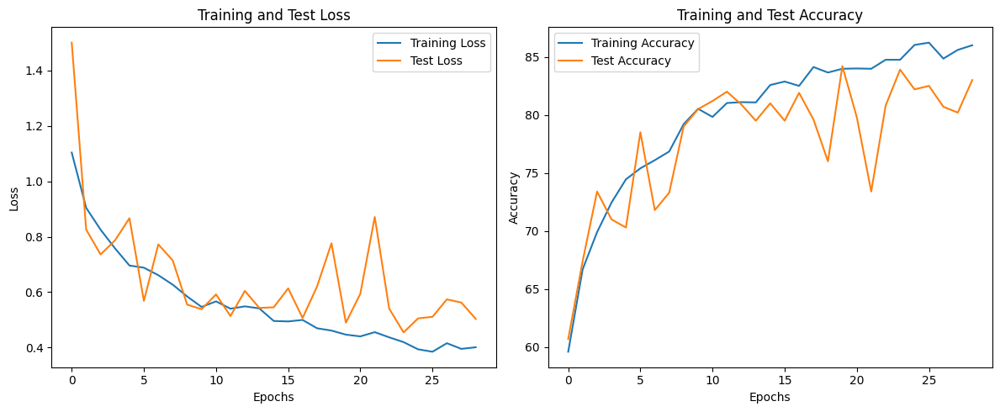

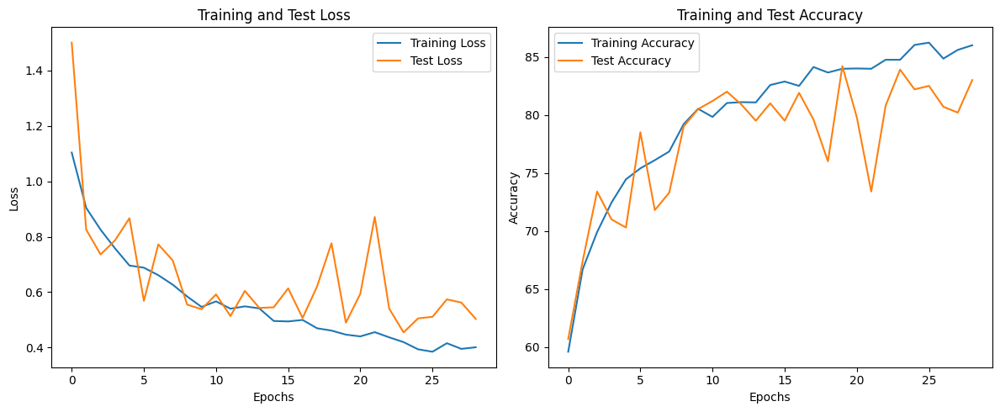

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
from torchsummary import summary
from tqdm import tqdm
import matplotlib.pyplot as plt

# Define the number of classes
n_class = len(train_dataset.classes)

# Define the InceptionV3-based model
class InceptionV3Model(nn.Module):
    def __init__(self, num_classes):
        super(InceptionV3Model, self).__init__()
        self.inceptionv3 = models.inception_v3(pretrained=True)
        in_features = self.inceptionv3.fc.in_features
        self.inceptionv3.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.inceptionv3(x)

# Set up data transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(299),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load the training and testing sets
train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Instantiate the InceptionV3 model
inceptionv3_model = InceptionV3Model(num_classes=n_class)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inceptionv3_model = inceptionv3_model.to(device)

# Print the model summary
summary(inceptionv3_model, input_size=(3, 299, 299), device=str(device))

# Define the optimizer and loss function
optimizer_inceptionv3 = optim.Adam(inceptionv3_model.parameters())
criterion_inceptionv3 = nn.CrossEntropyLoss()

# Number of training epochs
EPOCHS_INCEPTIONV3 = 50

train_losses = []  # List to store training losses
test_losses = []   # List to store testing losses
train_accuracies = []  # List to store training accuracies
test_accuracies = []   # List to store testing accuracies

best_test_loss = float('inf')  # Initialize with a very large value
early_stop_patience = 5  # Patience for early stopping
counter = 0  # Counter for early stopping

# Training loop for InceptionV3
for epoch in tqdm(range(EPOCHS_INCEPTIONV3)):
    inceptionv3_model.train()
    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer_inceptionv3.zero_grad()
        outputs, _ = inceptionv3_model(images)
        loss = criterion_inceptionv3(outputs, labels)
        loss.backward()
        optimizer_inceptionv3.step()

        running_train_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Testing the model
    inceptionv3_model.eval()
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = inceptionv3_model(images)
            loss = criterion_inceptionv3(outputs, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

        epoch_test_loss = running_test_loss / len(test_loader)
        test_losses.append(epoch_test_loss)
        test_accuracy = 100 * correct_test / total_test
        test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS_INCEPTIONV3}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # Early stopping
    if epoch_test_loss < best_test_loss:
        best_test_loss = epoch_test_loss
        counter = 0
    else:
        counter += 1
        if counter >= early_stop_patience:
            print("Early stopping triggered!")
            break

# Plotting loss and accuracy graphs
plt.figure(figsize=(12, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
from torchsummary import summary
from tqdm import tqdm

# Define the number of classes
n_class = len(train_dataset.classes)

# Define the InceptionV3-based model
class InceptionV3Model(nn.Module):
    def __init__(self, num_classes):
        super(InceptionV3Model, self).__init__()
        self.inceptionv3 = models.inception_v3(pretrained=True)
        in_features = self.inceptionv3.fc.in_features
        self.inceptionv3.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.inceptionv3(x)

# Set up data transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(299),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load the training and testing sets
train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Instantiate the InceptionV3 model
inceptionv3_model = InceptionV3Model(num_classes=n_class)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inceptionv3_model = inceptionv3_model.to(device)

# Print the model summary
summary(inceptionv3_model, input_size=(3, 299, 299), device=str(device))

# Define the optimizer and loss function
optimizer_inceptionv3 = optim.Adam(inceptionv3_model.parameters())
criterion_inceptionv3 = nn.CrossEntropyLoss()

# Number of training epochs
EPOCHS_INCEPTIONV3 = 3

# Training loop for InceptionV3
for epoch in tqdm(range(EPOCHS_INCEPTIONV3)):
    inceptionv3_model.train()

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer_inceptionv3.zero_grad()

        # Get the outputs (logits) from the main classifier
        outputs, aux_outputs = inceptionv3_model(images)

        # Calculate the loss using the main logits
        loss = criterion_inceptionv3(outputs, labels)

        # Backpropagation and optimization
        loss.backward()
        optimizer_inceptionv3.step()


# Evaluation on the test set
inceptionv3_model.eval()
correct_inceptionv3 = 0
total_inceptionv3 = 0

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = inceptionv3_model(images)
        _, preds = torch.max(outputs, 1)
        total_inceptionv3 += labels.size(0)
        correct_inceptionv3 += (preds == labels).sum().item()

accuracy_inceptionv3 = correct_inceptionv3 / total_inceptionv3 * 100
print('InceptionV3 Accuracy on the test set: {:.2f}%'.format(accuracy_inceptionv3))

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 126MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

100%|██████████| 3/3 [05:22<00:00, 107.40s/it]


InceptionV3 Accuracy on the test set: 70.40%


In [ ]:
# Save trained InceptionV3 model
torch.save(inceptionv3_model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/inceptionv3_model2.pth')

In [ ]:
# Load trained InceptionV3 model
loaded_mobile_net_v2_model = MobileNetV2Model(num_classes=5)
loaded_mobile_net_v2_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/inceptionv3_model2.pth'))
loaded_mobile_net_v2_model.eval()

# Ensemble learning

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets
# from torchsummary import summary
from tqdm import tqdm

# Define the number of classes
n_class = len(train_dataset.classes)

# Define the MobileNetV2-based model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.mobilenetv2 = models.mobilenet_v2(pretrained=True)
        in_features = self.mobilenetv2.classifier[1].in_features
        self.mobilenetv2.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.mobilenetv2(x)

# Define the InceptionV3-based model
class InceptionV3Model(nn.Module):
    def __init__(self, num_classes):
        super(InceptionV3Model, self).__init__()
        self.inceptionv3 = models.inception_v3(pretrained=True)
        in_features = self.inceptionv3.fc.in_features
        self.inceptionv3.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.inceptionv3(x)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Load trained MobileNetV2 model
loaded_mobile_net_v2_model = MobileNetV2Model(num_classes=n_class)
loaded_mobile_net_v2_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/mobile_net_v2_model.pth', map_location=device))
loaded_mobile_net_v2_model = loaded_mobile_net_v2_model.to(device)
loaded_mobile_net_v2_model.eval()

# Load trained InceptionV3 model
loaded_inceptionv3_model = InceptionV3Model(num_classes=n_class)
loaded_inceptionv3_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/inceptionv3_model2.pth', map_location=device))
loaded_inceptionv3_model = loaded_inceptionv3_model.to(device)
loaded_inceptionv3_model.eval()

# Load trained ResNet model
resnet_model = torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/resnet_18_model.pth', map_location=device)
resnet_model.eval()

# Data loader for the testing set
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Initialize counters
correct_ensemble = 0
total_ensemble = 0

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        # Get predictions from each loaded model
        outputs_mobile_net = loaded_mobile_net_v2_model(images)
        outputs_inceptionv3 = loaded_inceptionv3_model(images)
        outputs_resnet = resnet_model(images)

        # Perform voting to get the final prediction
        ensemble_preds = torch.argmax(outputs_mobile_net + outputs_inceptionv3 + outputs_resnet, dim=1)

        total_ensemble += labels.size(0)
        correct_ensemble += (ensemble_preds == labels).sum().item()

# Calculate accuracy for the ensemble model
accuracy_ensemble = correct_ensemble / total_ensemble * 100
print('Ensemble Model Accuracy on the test set: {:.2f}%'.format(accuracy_ensemble))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Ensemble Model Accuracy on the test set: 90.20%


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

loaded_ensemble_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        # Get predictions from the loaded ensemble model
        outputs_mobile_net = loaded_mobile_net_v2_model(images)
        outputs_inceptionv3 = loaded_inceptionv3_model(images)
        outputs_resnet = resnet_model(images)

        # Forward pass through the loaded ensemble model
        outputs_ensemble = loaded_ensemble_model(outputs_mobile_net, outputs_inceptionv3, outputs_resnet)

        # Get the predicted class with the highest confidence as the prediction
        _, preds = torch.max(outputs_ensemble, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Create a confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Display the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
class_labels = train_dataset.classes
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

NameError: name 'loaded_ensemble_model' is not defined

In [ ]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
loaded_mobile_net_v2_model.train()
loaded_inceptionv3_model.train()
resnet_model.train()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Early stopping parameters
early_stop_patience = 5
best_test_loss = float('inf')
counter = 0

# Number of training epochs
EPOCHS = 50

train_losses = []  # List to store training losses
test_losses = []  # List to store test losses
train_accuracies = []  # List to store training accuracies
test_accuracies = []  # List to store test accuracies

# Define the number of classes
n_class = len(train_dataset.classes)
num_classes = n_class

In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, input_sizes, num_classes):
        super(EnsembleModel, self).__init__()
        self.fc1 = nn.Linear(sum(input_sizes), 512)
        self.dropout = nn.Dropout(0.5)  # Dropout layer with a dropout rate of 0.5
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, input1, input2, input3):
        x = torch.cat([input1, input2, input3], dim=1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)  # Apply dropout
        x = self.fc2(x)
        return x


input_sizes = [1280, 2048, 512]

# Instantiate the ensemble model and move it to device
ensemble_model = EnsembleModel(input_sizes, num_classes=num_classes)
ensemble_model = ensemble_model.to(device)

In [ ]:
# Define loss function and optimizer (adjust hyperparameters as needed)
criterion = torch.nn.CrossEntropyLoss().to(device)
optimizer = optim.Adam(ensemble_model.parameters(), lr=0.01)

# Define learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=4)

# Early stopping parameters
early_stop_patience = 8
best_test_loss = float('inf')
counter = 0

In [ ]:
# Training loop
for epoch in range(EPOCHS):
    ensemble_model.train()  # Set the model to training mode
    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Get predictions from the loaded ensemble model
        outputs_mobile_net = loaded_mobile_net_v2_model(images)
        outputs_inceptionv3 = loaded_inceptionv3_model(images)
        outputs_resnet = resnet_model(images)

        # Forward pass through the loaded ensemble model
        outputs_ensemble = ensemble_model(outputs_mobile_net, outputs_inceptionv3, outputs_resnet)

        loss = criterion(outputs_ensemble, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        _, predicted = torch.max(outputs_ensemble.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Testing the model
    ensemble_model.eval()
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            # Get predictions from the loaded ensemble model
            outputs_mobile_net = loaded_mobile_net_v2_model(images)
            outputs_inceptionv3 = loaded_inceptionv3_model(images)
            outputs_resnet = resnet_model(images)

            # Forward pass through the loaded ensemble model
            outputs_ensemble = ensemble_model(outputs_mobile_net, outputs_inceptionv3, outputs_resnet)

            loss = criterion(outputs_ensemble, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs_ensemble.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

        epoch_test_loss = running_test_loss / len(test_loader)
        test_losses.append(epoch_test_loss)
        test_accuracy = 100 * correct_test / total_test
        test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # Updating the learning rate
    scheduler.step(epoch_test_loss)

    # Early stopping
    if epoch_test_loss < best_test_loss:
        best_test_loss = epoch_test_loss
        counter = 0
        # Save the best model weights
        torch.save(ensemble_model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/best_ensemble_model.pth')
    else:
        counter += 1
        if counter >= early_stop_patience:
            print("Early stopping triggered!")
            break

Epoch [1/50], Train Loss: 0.3117, Test Loss: 0.4883, Train Accuracy: 91.90%, Test Accuracy: 88.70%
Epoch [2/50], Train Loss: 0.2188, Test Loss: 0.5000, Train Accuracy: 93.28%, Test Accuracy: 86.60%
Epoch [3/50], Train Loss: 0.2134, Test Loss: 0.4472, Train Accuracy: 92.92%, Test Accuracy: 87.60%
Epoch [4/50], Train Loss: 0.1770, Test Loss: 0.4731, Train Accuracy: 94.08%, Test Accuracy: 88.00%
Epoch [5/50], Train Loss: 0.2147, Test Loss: 0.4307, Train Accuracy: 93.62%, Test Accuracy: 88.20%
Epoch [6/50], Train Loss: 0.2002, Test Loss: 0.4643, Train Accuracy: 93.97%, Test Accuracy: 88.50%
Epoch [7/50], Train Loss: 0.2122, Test Loss: 0.3924, Train Accuracy: 93.28%, Test Accuracy: 87.60%
Epoch [8/50], Train Loss: 0.1861, Test Loss: 0.4753, Train Accuracy: 94.05%, Test Accuracy: 89.00%
Epoch [9/50], Train Loss: 0.2005, Test Loss: 0.3870, Train Accuracy: 93.90%, Test Accuracy: 88.30%
Epoch [10/50], Train Loss: 0.1832, Test Loss: 0.4805, Train Accuracy: 94.10%, Test Accuracy: 87.30%
Epoch [11

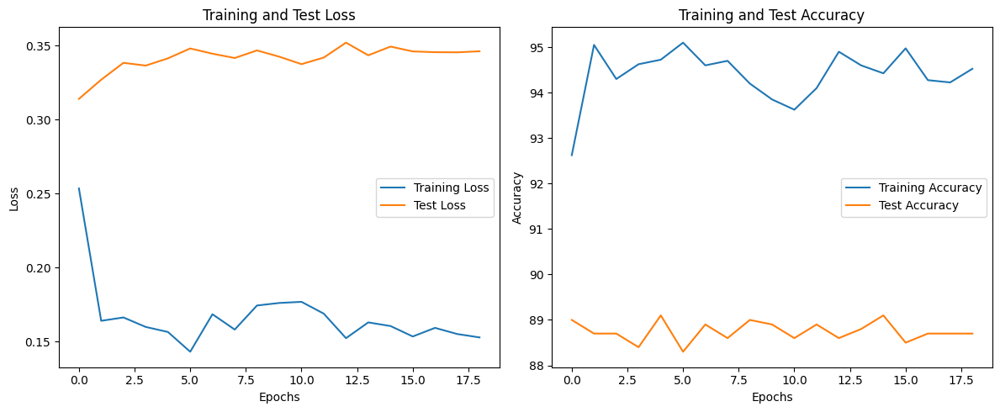

In [ ]:
# Plotting loss and accuracy graphs
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Save the entire model
import os
os.makedirs('models', exist_ok=True)
torch.save(ensemble_model, 'models/ensemble_model.pth')

In [ ]:
# Load the saved ensemble model
loaded_ensemble_model = torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/ensemble_model.pth')
loaded_ensemble_model.eval()

EnsembleModel(
  (fc): Linear(in_features=15, out_features=5, bias=True)
)

In [ ]:
print("============查看GPU信息================")
# 查看GPU信息
!/opt/bin/nvidia-smi
print("==============查看pytorch版本==============")
# 查看pytorch版本
import torch
print(torch.__version__)
print("============查看虚拟机硬盘容量================")
# 查看虚拟机硬盘容量
!df -lh
print("============查看cpu配置================")
# 查看cpu配置
!cat /proc/cpuinfo | grep model\ name
print("=============查看内存容量===============")
# 查看内存容量
!cat /proc/meminfo | grep MemTotal


============查看GPU信息================
/bin/bash: line 1: /opt/bin/nvidia-smi: No such file or directory
==============查看pytorch版本==============
2.2.1+cu121
============查看虚拟机硬盘容量================
Filesystem      Size  Used Avail Use% Mounted on
overlay         108G   25G   83G  24% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.1G  849M  57% /usr/sbin/docker-init
tmpfs           6.4G  136K  6.4G   1% /var/colab
/dev/sda1        70G   41G   29G  59% /kaggle/input
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware
============查看cpu配置================
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
=============查看内存容量===============
MemTotal:       13290480 kB


# Ensemble Learning


In [ ]:
import time
import os
from tqdm import tqdm

import pandas as pd
import numpy as np

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from torchvision import transforms

# Training dataset image preprocessing: resizing and cropping, image augmentation, converting to Tensor, normalization
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
# Testing dataset image preprocessing -RCTN: Resizing, cropping, converting to Tensor, normalization
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])
dataset_dir = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split'
train_path = os.path.join(dataset_dir, 'train')
test_path = os.path.join(dataset_dir, 'test')
print('Training set path', train_path)
print('Testing set path', test_path)

from torchvision import datasets
# Load the training set
train_dataset = datasets.ImageFolder(train_path, train_transform)
# Load the testing set
test_dataset = datasets.ImageFolder(test_path, test_transform)

print('Number of images in the training set:', len(train_dataset))
print('Number of classes:', len(train_dataset.classes))
print('Class names:', train_dataset.classes)
print('Number of images in the testing set:', len(test_dataset))
print('Number of classes:', len(test_dataset.classes))
print('Class names:', test_dataset.classes)

Training set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train
Testing set path /content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/test
Number of images in the training set: 4000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']
Number of images in the testing set: 1000
Number of classes: 5
Class names: ['apple_pie', 'cheesecake', 'chicken_curry', 'ice_cream', 'sushi']


ResNet Accuracy: 88.7%
MobileNetV2 Accuracy: 89.4%
InceptionV3 Accuracy: 83.0%
Weights: [0.3397165836844121, 0.3423975488318652, 0.31788586748372266]


<Figure size 1000x600 with 0 Axes>

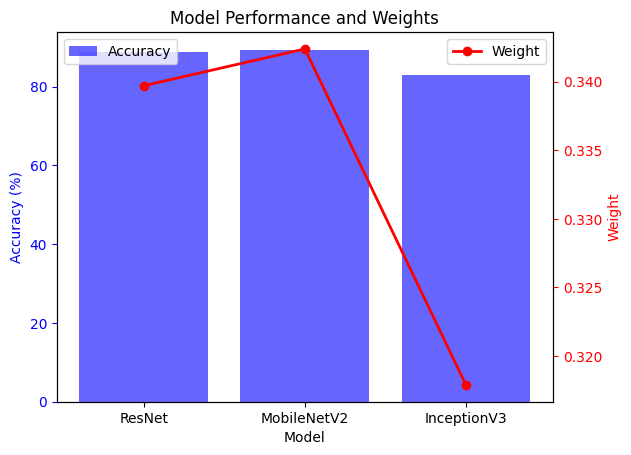

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader

# 定义设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 数据预处理和加载
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(299),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# 假定 train_path 和 test_path 已经定义
train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

BATCH_SIZE = 32  # 假设批处理大小为32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# 模型定义
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.mobilenetv2 = models.mobilenet_v2(pretrained=True)
        in_features = self.mobilenetv2.classifier[1].in_features
        self.mobilenetv2.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.mobilenetv2(x)

class InceptionV3Model(nn.Module):
    def __init__(self, num_classes):
        super(InceptionV3Model, self).__init__()
        self.inceptionv3 = models.inception_v3(pretrained=True)
        in_features = self.inceptionv3.fc.in_features
        self.inceptionv3.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.inceptionv3(x)

# 模型加载
n_class = len(train_dataset.classes)

loaded_mobile_net_v2_model = MobileNetV2Model(num_classes=n_class)
loaded_mobile_net_v2_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/mobile_net_v2_model.pth', map_location=device))
loaded_mobile_net_v2_model = loaded_mobile_net_v2_model.to(device)
loaded_mobile_net_v2_model.eval()

loaded_inceptionv3_model = InceptionV3Model(num_classes=n_class)
loaded_inceptionv3_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/inceptionv3_model2.pth', map_location=device))
loaded_inceptionv3_model = loaded_inceptionv3_model.to(device)
loaded_inceptionv3_model.eval()

resnet_model = torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/resnet_18_model.pth', map_location=device)
resnet_model = resnet_model.to(device)
resnet_model.eval()

# 评估函数
def evaluate_model(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    return accuracy

# 评估每个模型并计算权重
resnet_accuracy = evaluate_model(resnet_model, test_loader)
mobilenet_accuracy = evaluate_model(loaded_mobile_net_v2_model, test_loader)
inception_accuracy = evaluate_model(loaded_inceptionv3_model, test_loader)

total_accuracy = resnet_accuracy + mobilenet_accuracy + inception_accuracy
weights = [resnet_accuracy / total_accuracy, mobilenet_accuracy / total_accuracy, inception_accuracy / total_accuracy]

print(f'ResNet Accuracy: {resnet_accuracy}%')
print(f'MobileNetV2 Accuracy: {mobilenet_accuracy}%')
print(f'InceptionV3 Accuracy: {inception_accuracy}%')
print(f'Weights: {weights}')

import matplotlib.pyplot as plt
import numpy as np

# 模型的名称
model_names = ['ResNet', 'MobileNetV2', 'InceptionV3']

# 模型的准确率
accuracies = [resnet_accuracy, mobilenet_accuracy, inception_accuracy]

# 模型的权重
model_weights = weights

# 设置图表大小
plt.figure(figsize=(10, 6))

# 创建一个带有双轴的图表
fig, ax1 = plt.subplots()

# 设置条形图
ax1.bar(model_names, accuracies, color='b', alpha=0.6, label='Accuracy')
ax1.set_xlabel('Model')
ax1.set_ylabel('Accuracy (%)', color='b')
ax1.tick_params('y', colors='b')

# 创建另一个轴用于显示权重
ax2 = ax1.twinx()
ax2.plot(model_names, model_weights, color='r', marker='o', label='Weight', linewidth=2)
ax2.set_ylabel('Weight', color='r')
ax2.tick_params('y', colors='r')

# 添加图例
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Model Performance and Weights')
plt.show()

tensor([0, 0, 3, 0, 2, 0, 0, 3, 0, 0])


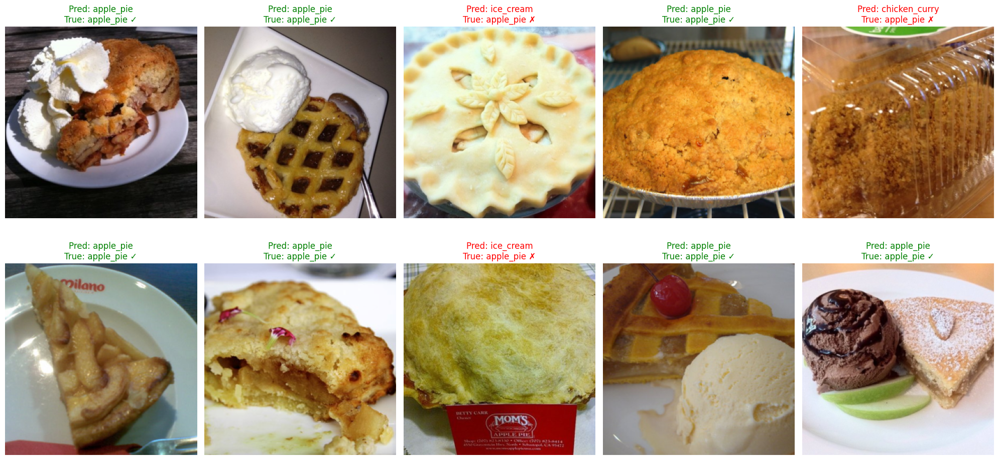

In [ ]:
def ensemble_predictions(models, weights, dataloader):
    # 确保模型和权重列表的长度相同
    assert len(models) == len(weights), "每个模型必须有对应的权重。"

    total_predictions = None

    # 禁用梯度计算，因为在推理时不需要
    with torch.no_grad():
        for images, _ in dataloader:
            images = images.to(device)
            # 获取每个模型的预测并应用权重
            weighted_predictions = [model(images).cpu() * weight for model, weight in zip(models, weights)]

            # 将所有模型的加权预测相加
            ensemble_pred = torch.sum(torch.stack(weighted_predictions), dim=0)

            # 存储所有加权平均后的预测
            if total_predictions is None:
                total_predictions = ensemble_pred
            else:
                total_predictions = torch.cat((total_predictions, ensemble_pred), dim=0)

    return total_predictions

# 将模型和权重组成列表
models = [resnet_model, loaded_mobile_net_v2_model, loaded_inceptionv3_model]
weights = [resnet_accuracy, mobilenet_accuracy, inception_accuracy]
# 标准化权重
weights = [weight / sum(weights) for weight in weights]

# 使用测试数据加载器获取集成模型的预测
ensemble_preds = ensemble_predictions(models, weights, test_loader)

# 获取预测类别
_, predicted_classes = torch.max(ensemble_preds, 1)

# 示例：输出前10个预测类别
print(predicted_classes[:10])

import matplotlib.pyplot as plt

def show_images_with_predictions_and_accuracy(dataloader, predicted_classes, true_labels, class_names, num_images=10):
    """
    显示带有预测标签和预测正确性的图像。

    :param dataloader: 用于加载数据的DataLoader。
    :param predicted_classes: 模型的预测类别。
    :param true_labels: 真实的标签。
    :param class_names: 类别名称的列表。
    :param num_images: 要显示的图像数量。
    """
    # 初始化一个计数器，跟踪已显示的图像数量
    images_shown = 0
    # 从DataLoader中获取所有真实标签
    all_true_labels = []
    for _, labels in dataloader:
        all_true_labels.extend(labels)

    # 确保在num_images和batch的大小之间取较小的一个
    num_images = min(num_images, len(predicted_classes))

    plt.figure(figsize=(20, 10))

    for images, labels in dataloader:
        for i, image in enumerate(images):
            if images_shown < num_images:
                ax = plt.subplot(num_images//5, 5, images_shown + 1)
                ax.axis('off')
                # 检查预测是否正确
                correct = "✓" if predicted_classes[images_shown] == all_true_labels[images_shown] else "✗"
                ax.set_title(f'Pred: {class_names[predicted_classes[images_shown]]}\nTrue: {class_names[all_true_labels[images_shown]]} {correct}', color=("green" if correct == "✓" else "red"))
                image = image.numpy().transpose((1, 2, 0))
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                image = std * image + mean
                image = np.clip(image, 0, 1)
                plt.imshow(image)

                images_shown += 1
            else:
                break
        if images_shown >= num_images:
            break

    plt.tight_layout()
    plt.show()

# 从数据加载器中提取真实标签
true_labels = []
for _, labels in test_loader:
    true_labels.extend(labels)

# 注意：这里假设true_labels已经准备好，并且与dataloader中的标签顺序匹配
# 如果之前没有准备true_labels列表，你需要从dataloader中提取这些标签
show_images_with_predictions_and_accuracy(test_loader, predicted_classes.cpu(), true_labels, class_names, num_images=10)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import torch
import numpy as np

# 假定 predicted_classes 和 true_labels 已经从模型预测和数据加载器中获取

def evaluate_ensemble_performance(predicted_classes, true_labels):
    # 将Tensor转换为NumPy数组，用于性能评估
    predicted_classes = predicted_classes.numpy()
    true_labels = true_labels.numpy()

    # 计算性能指标
    accuracy = accuracy_score(true_labels, predicted_classes)
    precision = precision_score(true_labels, predicted_classes, average='weighted', zero_division=0)
    recall = recall_score(true_labels, predicted_classes, average='weighted', zero_division=0)
    f1 = f1_score(true_labels, predicted_classes, average='weighted', zero_division=0)

    return accuracy, precision, recall, f1

# 从数据加载器中收集真实的标签，以便计算指标
true_labels = []
for _, labels in test_loader:
    true_labels.extend(labels)

true_labels = torch.tensor(true_labels) # 转换为Tensor以匹配predicted_classes的数据类型

# 使用evaluate_ensemble_performance函数计算性能指标
accuracy, precision, recall, f1 = evaluate_ensemble_performance(predicted_classes, true_labels)

# 现在，使用之前计算得到的指标值
plot_performance_metrics(accuracy, precision, recall, f1)

NameError: name 'plot_performance_metrics' is not defined

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt

# 真实标签需要是二进制形式（独热编码）
n_classes = len(class_names)
true_labels_binarized = label_binarize(true_labels, classes=range(n_classes))

# 假设 ensemble_preds 是模型的预测概率输出
# 对于每个类别，计算ROC曲线和AUC
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(true_labels_binarized[:, i], ensemble_preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 绘制所有类别的ROC曲线
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(class_names[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC (One-vs-All)')
plt.legend(loc="lower right")
plt.show()

NameError: name 'true_labels_binarize' is not defined

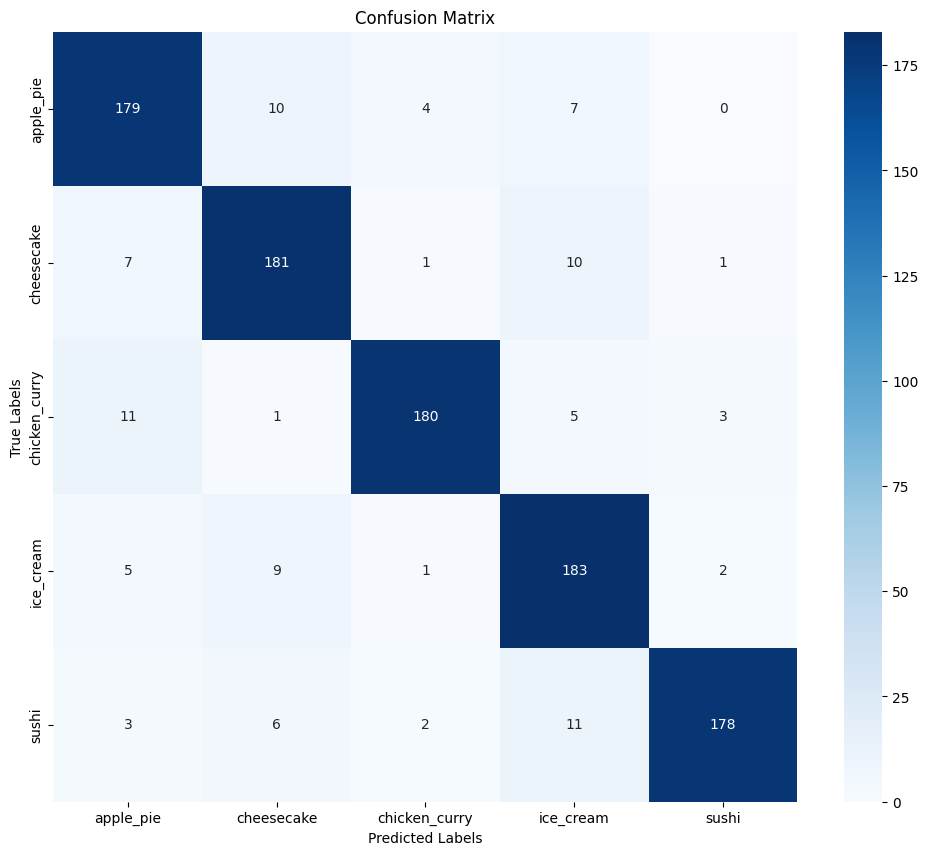

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(true_labels, predicted_classes, class_names):
    cm = confusion_matrix(true_labels, predicted_classes)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

plot_confusion_matrix(true_labels, predicted_classes.numpy(), class_names)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:
# 训练参数
EPOCHS = 20
early_stop_patience = 5

# 定义损失函数和优化器
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(ensemble_model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2)

# 初始化变量用于记录训练过程中的损失和准确率
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

# 训练循环
best_test_loss = float('inf')
counter = 0

for epoch in range(EPOCHS):
    ensemble_model.train()  # 设置模型为训练模式
    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # 获取每个预训练模型的输出
        outputs_mobile_net = loaded_mobile_net_v2_model(images)
        outputs_inceptionv3 = loaded_inceptionv3_model(images)
        outputs_resnet = resnet_model(images)

        # 前向传播
        outputs_ensemble = ensemble_model(outputs_mobile_net, outputs_inceptionv3, outputs_resnet)

        loss = criterion(outputs_ensemble, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        _, predicted = torch.max(outputs_ensemble.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)
    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # 测试模型
    ensemble_model.eval()
    running_test_loss = 0.0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            # 获取每个预训练模型的输出
            outputs_mobile_net = loaded_mobile_net_v2_model(images)
            outputs_inceptionv3 = loaded_inceptionv3_model(images)
            outputs_resnet = resnet_model(images)

            # 前向传播
            outputs_ensemble = ensemble_model(outputs_mobile_net, outputs_inceptionv3, outputs_resnet)

            loss = criterion(outputs_ensemble, labels)
            running_test_loss += loss.item()

            _, predicted = torch.max(outputs_ensemble.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

        epoch_test_loss = running_test_loss / len(test_loader)
        test_losses.append(epoch_test_loss)
        test_accuracy = 100 * correct_test / total_test
        test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # 更新学习率
    scheduler.step(epoch_test_loss)

    # 早停
    if epoch_test_loss < best_test_loss:
        best_test_loss = epoch_test_loss
        counter = 0
        # 保存最佳模型权重
        torch.save(ensemble_model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/best_ensemble_model.pth')
    else:
        counter += 1
        if counter >= early_stop_patience:
            print("Early stopping triggered!")
            break

In [ ]:
# 绘制损失和准确率曲线
plt.figure(figsize=(12, 5))

# 损失曲线
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 准确率曲线
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Ensemble Module

In [ ]:
import torch
import itertools
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os
import numpy as np
from torchvision.models.inception import InceptionOutputs
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

from itertools import cycle
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:
# 设备配置
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Set up data transformations
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(299),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
dataset_dir = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split'
train_path = os.path.join(dataset_dir, 'train')
test_path = os.path.join(dataset_dir, 'test')

train_dataset = datasets.ImageFolder(train_path, train_transform)
test_dataset = datasets.ImageFolder(test_path, test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# List of class names
class_names = train_dataset.classes
n_class = len(class_names)
# Mapping: Class to index
class_to_idx = train_dataset.class_to_idx

In [ ]:
# Mapping: Index to class
idx_to_labels = {y: x for x, y in train_dataset.class_to_idx.items()}
idx_to_labels

{0: 'apple_pie',
 1: 'cheesecake',
 2: 'chicken_curry',
 3: 'ice_cream',
 4: 'sushi'}

In [ ]:
# 模型定义
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.mobilenetv2 = models.mobilenet_v2(pretrained=True)
        self.mobilenetv2.classifier[1] = nn.Linear(self.mobilenetv2.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.mobilenetv2(x)

In [ ]:
class InceptionV3Model(nn.Module):
    def __init__(self, num_classes):
        super(InceptionV3Model, self).__init__()
        self.inceptionv3 = models.inception_v3(pretrained=True)
        in_features = self.inceptionv3.fc.in_features
        self.inceptionv3.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.inceptionv3(x)

In [ ]:
# 模型加载
n_class = len(train_dataset.classes)

loaded_mobile_net_v2_model = MobileNetV2Model(num_classes=n_class)
loaded_mobile_net_v2_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/mobile_net_v2_model.pth', map_location=device))
loaded_mobile_net_v2_model = loaded_mobile_net_v2_model.to(device)
loaded_mobile_net_v2_model.eval()

loaded_inceptionv3_model = InceptionV3Model(num_classes=n_class)
loaded_inceptionv3_model.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/inceptionv3_model2.pth', map_location=device))
loaded_inceptionv3_model = loaded_inceptionv3_model.to(device)
loaded_inceptionv3_model.eval()

resnet_model = torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/resnet_18_model.pth', map_location=device)
resnet_model = resnet_model.to(device)
resnet_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 58.9MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# class EnsembleModel(nn.Module):
#     def __init__(self, modelA, modelB, modelC, weights):
#         super(EnsembleModel, self).__init__()
#         self.modelA = modelA
#         self.modelB = modelB
#         self.modelC = modelC
#         self.weights = torch.tensor(weights, device=device, dtype=torch.float32)

#     def forward(self, x):
#         outputA = self.modelA(x)
#         outputB = self.modelB(x)
#         outputC = self.modelC(x)

#         # Ensure outputs are weighted and summed appropriately
#         output = (self.weights[0] * outputA +
#                   self.weights[1] * outputB +
#                   self.weights[2] * outputC)
#         return output

In [ ]:
class EnsembleModel(nn.Module):
    def __init__(self, modelA, modelB, modelC, weights):
        super(EnsembleModel, self).__init__()
        self.modelA = modelA
        self.modelB = modelB
        self.modelC = modelC
        self.weights = torch.tensor(weights, device=device, dtype=torch.float32)

    def forward(self, x):
        outputA = self.modelA(x)
        outputB = self.modelB(x)
        outputC = self.modelC(x)

        # 检查并处理InceptionV3模型的输出
        if isinstance(outputB, InceptionOutputs):
            outputB = outputB.logits  # 提取主输出

        # 对于ResNet和MobileNetV2的输出，直接使用
        # 现在所有的输出都应该是形状相同的张量

        output = (self.weights[0] * outputA +
                  self.weights[1] * outputB +
                  self.weights[2] * outputC)

        return output


In [ ]:
def evaluate_model(model, test_loader):
    model.eval()  # Ensures the model is in evaluation mode.
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            # Direct handling for InceptionV3 output format
            if hasattr(outputs, 'logits'):
                outputs = outputs.logits
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    return accuracy


In [ ]:
# 评估函数
def evaluate_model(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return 100 * correct / total

In [ ]:
# 评估每个模型并计算权重
resnet_accuracy = evaluate_model(resnet_model, test_loader)
mobilenet_accuracy = evaluate_model(loaded_mobile_net_v2_model, test_loader)
inception_accuracy = evaluate_model(loaded_inceptionv3_model, test_loader)

total_accuracy = resnet_accuracy + mobilenet_accuracy + inception_accuracy
weights = [resnet_accuracy / total_accuracy, mobilenet_accuracy / total_accuracy, inception_accuracy / total_accuracy]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


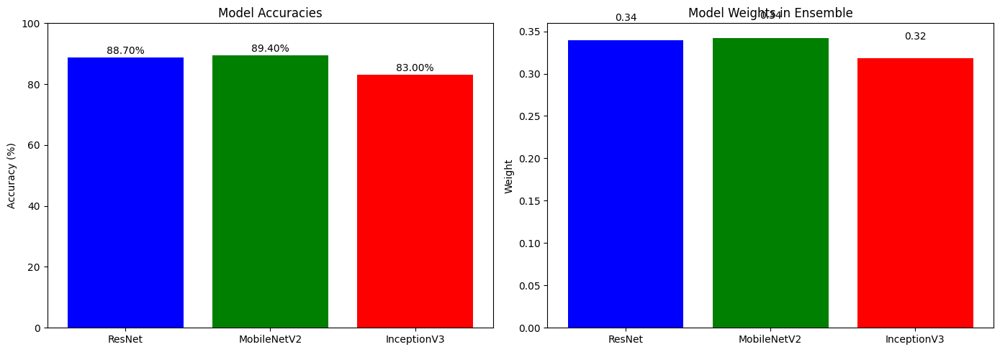

In [ ]:
# Model names
model_names = ['ResNet', 'MobileNetV2', 'InceptionV3']

# Accuracies
accuracies = [resnet_accuracy, mobilenet_accuracy, inception_accuracy]

# Creating subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Plotting accuracies
axs[0].bar(model_names, accuracies, color=['blue', 'green', 'red'])
axs[0].set_title('Model Accuracies')
axs[0].set_ylabel('Accuracy (%)')
axs[0].set_ylim(0, 100)  # Assuming accuracy is a percentage
for i, v in enumerate(accuracies):
    axs[0].text(i, v + 0.5, f"{v:.2f}%", ha='center', va='bottom')

# Plotting weights
axs[1].bar(model_names, weights, color=['blue', 'green', 'red'])
axs[1].set_title('Model Weights in Ensemble')
axs[1].set_ylabel('Weight')
for i, v in enumerate(weights):
    axs[1].text(i, v + 0.02, f"{v:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [ ]:
# 创建集成模型实例
ensemble_model = EnsembleModel(loaded_mobile_net_v2_model, loaded_inceptionv3_model, resnet_model, weights).to(device)

# 微调策略
# 首先冻结所有模型的参数
for model in [loaded_mobile_net_v2_model, loaded_inceptionv3_model, resnet_model]:
    for param in model.parameters():
        param.requires_grad = False

# 然后选择性地解冻某些层以进行微调
# 例如，只对MobileNetV2的最后一层进行微调
for param in loaded_mobile_net_v2_model.mobilenetv2.classifier.parameters():
    param.requires_grad = True

# 对于InceptionV3，也许你想要微调辅助分类器和主分类器的参数
for param in loaded_inceptionv3_model.inceptionv3.AuxLogits.fc.parameters():
    param.requires_grad = True
for param in loaded_inceptionv3_model.inceptionv3.fc.parameters():
    param.requires_grad = True

# 对于ResNet，微调最后的卷积层
for param in resnet_model.layer4.parameters():
    param.requires_grad = True


# Training

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(ensemble_model.parameters(), lr=0.0001)

In [ ]:
# 定义早停类
class EarlyStopping:
    def __init__(self, patience=7, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_loss = None
        self.early_stop = False
        self.counter = 0

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

In [ ]:
# 实例化早停对象
early_stopping = EarlyStopping(patience=5, delta=0.01)

In [ ]:
# 训练和测试循环 （0.001)
EPOCHS = 50
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []

for epoch in range(EPOCHS):
    # 训练阶段
    ensemble_model.train()
    epoch_train_loss = 0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = ensemble_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_accuracy = 100 * correct_train / total_train
    epoch_train_loss /= total_train

    # 测试阶段
    ensemble_model.eval()
    epoch_test_loss = 0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = ensemble_model(images)
            loss = criterion(outputs, labels)

            epoch_test_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_accuracy = 100 * correct_test / total_test
    epoch_test_loss /= total_test

    train_losses.append(epoch_train_loss)
    test_losses.append(epoch_test_loss)
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # 早停检查
    early_stopping(epoch_test_loss)
    if early_stopping.early_stop:
        print("Early stopping")
        break

Epoch [1/50], Train Loss: 0.2742, Test Loss: 0.3165, Train Accuracy: 90.70%, Test Accuracy: 90.40%
Epoch [2/50], Train Loss: 0.2568, Test Loss: 0.2938, Train Accuracy: 90.78%, Test Accuracy: 90.80%
Epoch [3/50], Train Loss: 0.2436, Test Loss: 0.3140, Train Accuracy: 91.47%, Test Accuracy: 89.30%
Epoch [4/50], Train Loss: 0.2242, Test Loss: 0.3051, Train Accuracy: 92.25%, Test Accuracy: 90.30%
Epoch [5/50], Train Loss: 0.2348, Test Loss: 0.3121, Train Accuracy: 92.22%, Test Accuracy: 90.80%
Epoch [6/50], Train Loss: 0.2298, Test Loss: 0.3219, Train Accuracy: 92.00%, Test Accuracy: 90.00%
Epoch [7/50], Train Loss: 0.2165, Test Loss: 0.3154, Train Accuracy: 92.33%, Test Accuracy: 90.20%
Epoch [8/50], Train Loss: 0.2299, Test Loss: 0.3133, Train Accuracy: 91.97%, Test Accuracy: 89.90%
Epoch [9/50], Train Loss: 0.2179, Test Loss: 0.3228, Train Accuracy: 92.58%, Test Accuracy: 90.50%
Epoch [10/50], Train Loss: 0.2256, Test Loss: 0.3317, Train Accuracy: 92.40%, Test Accuracy: 89.50%
Early sto

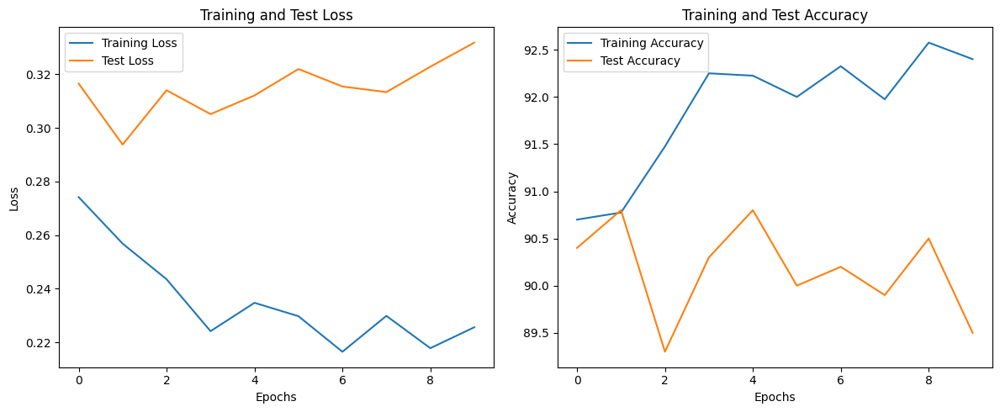

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# 训练和测试循环(0.01)
EPOCHS = 50
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []

for epoch in range(EPOCHS):
    # 训练阶段
    ensemble_model.train()
    epoch_train_loss = 0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = ensemble_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_accuracy = 100 * correct_train / total_train
    epoch_train_loss /= total_train

    # 测试阶段
    ensemble_model.eval()
    epoch_test_loss = 0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = ensemble_model(images)
            loss = criterion(outputs, labels)

            epoch_test_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_accuracy = 100 * correct_test / total_test
    epoch_test_loss /= total_test

    train_losses.append(epoch_train_loss)
    test_losses.append(epoch_test_loss)
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # 早停检查
    early_stopping(epoch_test_loss)
    if early_stopping.early_stop:
        print("Early stopping")
        break

Epoch [1/50], Train Loss: 0.3591, Test Loss: 0.3922, Train Accuracy: 88.12%, Test Accuracy: 88.00%
Epoch [2/50], Train Loss: 0.3459, Test Loss: 0.3597, Train Accuracy: 88.20%, Test Accuracy: 89.40%
Epoch [3/50], Train Loss: 0.3262, Test Loss: 0.4275, Train Accuracy: 89.05%, Test Accuracy: 88.00%
Epoch [4/50], Train Loss: 0.3310, Test Loss: 0.3566, Train Accuracy: 88.97%, Test Accuracy: 89.50%
Epoch [5/50], Train Loss: 0.3151, Test Loss: 0.3880, Train Accuracy: 90.03%, Test Accuracy: 89.40%
Epoch [6/50], Train Loss: 0.3312, Test Loss: 0.4010, Train Accuracy: 88.75%, Test Accuracy: 89.00%
Epoch [7/50], Train Loss: 0.3045, Test Loss: 0.3732, Train Accuracy: 89.90%, Test Accuracy: 90.00%
Epoch [8/50], Train Loss: 0.2989, Test Loss: 0.3967, Train Accuracy: 90.15%, Test Accuracy: 88.70%
Epoch [9/50], Train Loss: 0.3179, Test Loss: 0.3840, Train Accuracy: 89.83%, Test Accuracy: 89.30%
Early stopping


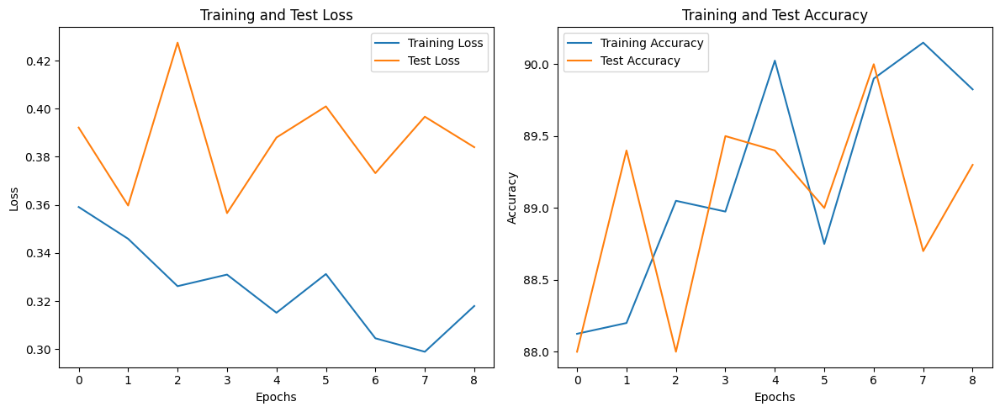

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# 训练和测试循环(0.0005)
EPOCHS = 50
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []

for epoch in range(EPOCHS):
    # 训练阶段
    ensemble_model.train()
    epoch_train_loss = 0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = ensemble_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_accuracy = 100 * correct_train / total_train
    epoch_train_loss /= total_train

    # 测试阶段
    ensemble_model.eval()
    epoch_test_loss = 0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = ensemble_model(images)
            loss = criterion(outputs, labels)

            epoch_test_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_accuracy = 100 * correct_test / total_test
    epoch_test_loss /= total_test

    train_losses.append(epoch_train_loss)
    test_losses.append(epoch_test_loss)
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # 早停检查
    early_stopping(epoch_test_loss)
    if early_stopping.early_stop:
        print("Early stopping")
        break

Epoch [1/50], Train Loss: 0.2453, Test Loss: 0.3545, Train Accuracy: 91.95%, Test Accuracy: 89.30%
Epoch [2/50], Train Loss: 0.2600, Test Loss: 0.3392, Train Accuracy: 91.33%, Test Accuracy: 90.40%
Epoch [3/50], Train Loss: 0.2517, Test Loss: 0.3453, Train Accuracy: 91.38%, Test Accuracy: 89.90%
Epoch [4/50], Train Loss: 0.2586, Test Loss: 0.3326, Train Accuracy: 91.22%, Test Accuracy: 90.60%
Epoch [5/50], Train Loss: 0.2494, Test Loss: 0.3294, Train Accuracy: 91.88%, Test Accuracy: 90.60%
Epoch [6/50], Train Loss: 0.2429, Test Loss: 0.3354, Train Accuracy: 91.28%, Test Accuracy: 90.10%
Epoch [7/50], Train Loss: 0.2392, Test Loss: 0.3386, Train Accuracy: 91.72%, Test Accuracy: 90.50%
Epoch [8/50], Train Loss: 0.2464, Test Loss: 0.3227, Train Accuracy: 91.65%, Test Accuracy: 90.50%
Epoch [9/50], Train Loss: 0.2496, Test Loss: 0.3279, Train Accuracy: 91.08%, Test Accuracy: 90.50%
Epoch [10/50], Train Loss: 0.2484, Test Loss: 0.3338, Train Accuracy: 91.35%, Test Accuracy: 89.90%
Epoch [11

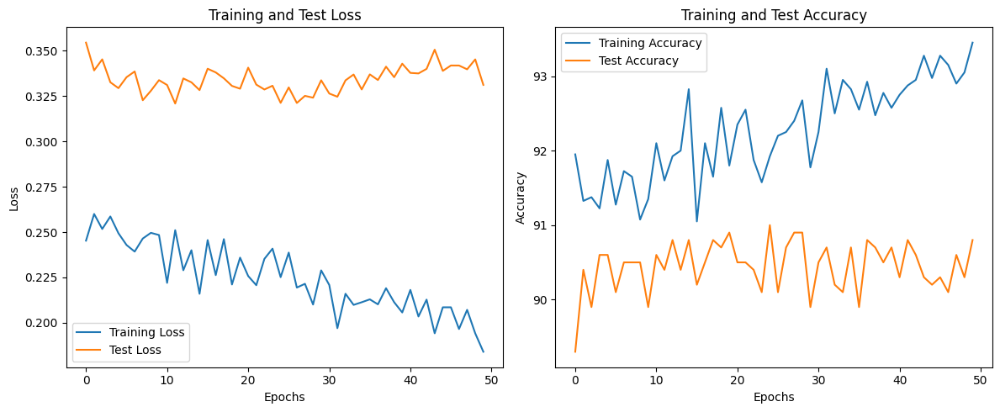

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

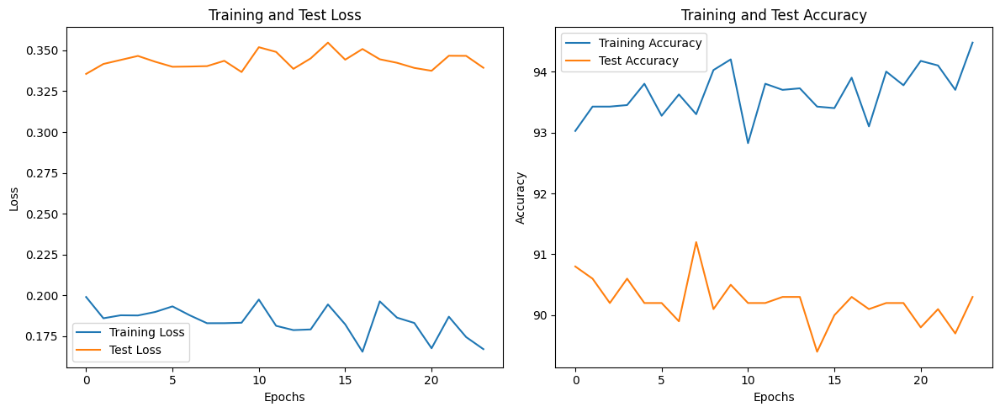

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(ensemble_model.parameters(), lr=0.01)
# Learning Rate Scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

In [ ]:
# 定义早停类
class EarlyStopping:
    def __init__(self, patience=7, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_loss = None
        self.early_stop = False
        self.counter = 0

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

In [ ]:
# 实例化早停对象
early_stopping = EarlyStopping(patience=4, delta=0.01)

In [ ]:
# 训练和测试循环(Learning Rate Scheduler)
EPOCHS = 50
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []

best_test_accuracy = 0.0
best_epoch = 0
best_model_state = None

for epoch in range(EPOCHS):
    # 训练阶段
    ensemble_model.train()
    epoch_train_loss = 0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = ensemble_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_accuracy = 100 * correct_train / total_train
    epoch_train_loss /= total_train

    # 测试阶段
    ensemble_model.eval()
    epoch_test_loss = 0
    correct_test = 0
    total_test = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = ensemble_model(images)
            loss = criterion(outputs, labels)

            epoch_test_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_accuracy = 100 * correct_test / total_test
    epoch_test_loss /= total_test

    train_losses.append(epoch_train_loss)
    test_losses.append(epoch_test_loss)
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

    print(f"Epoch [{epoch + 1}/{EPOCHS}], "
          f"Train Loss: {epoch_train_loss:.4f}, "
          f"Test Loss: {epoch_test_loss:.4f}, "
          f"Train Accuracy: {train_accuracy:.2f}%, "
          f"Test Accuracy: {test_accuracy:.2f}%")

    # Update the best model logic
    if test_accuracy > best_test_accuracy:
        best_test_accuracy = test_accuracy  # Update the best validation/test accuracy
        best_epoch = epoch + 1  # Update the best epoch
        best_model_state = ensemble_model.state_dict()  # Save the model's state_dict

    # Step the scheduler
    scheduler.step()

    # Early stopping check
    early_stopping(epoch_test_loss)
    if early_stopping.early_stop:
        print("Early stopping")
        break

# Print the best test accuracy after the training loop has completed
print(f"Best Test Accuracy: {best_test_accuracy:.2f}% at Epoch {best_epoch}")

Epoch [1/50], Train Loss: 0.3137, Test Loss: 0.4205, Train Accuracy: 90.10%, Test Accuracy: 89.50%
Epoch [2/50], Train Loss: 0.3688, Test Loss: 0.4377, Train Accuracy: 88.30%, Test Accuracy: 88.90%
Epoch [3/50], Train Loss: 0.2965, Test Loss: 0.4707, Train Accuracy: 89.90%, Test Accuracy: 88.40%
Epoch [4/50], Train Loss: 0.3311, Test Loss: 0.4103, Train Accuracy: 89.92%, Test Accuracy: 90.00%
Epoch [5/50], Train Loss: 0.2656, Test Loss: 0.4658, Train Accuracy: 90.90%, Test Accuracy: 88.70%
Epoch [6/50], Train Loss: 0.2842, Test Loss: 0.4389, Train Accuracy: 90.78%, Test Accuracy: 89.80%
Epoch [7/50], Train Loss: 0.2854, Test Loss: 0.4553, Train Accuracy: 90.78%, Test Accuracy: 88.40%
Epoch [8/50], Train Loss: 0.2563, Test Loss: 0.3851, Train Accuracy: 91.88%, Test Accuracy: 90.50%
Epoch [9/50], Train Loss: 0.2589, Test Loss: 0.3809, Train Accuracy: 91.65%, Test Accuracy: 90.70%
Epoch [10/50], Train Loss: 0.2452, Test Loss: 0.3636, Train Accuracy: 92.08%, Test Accuracy: 90.50%
Epoch [11

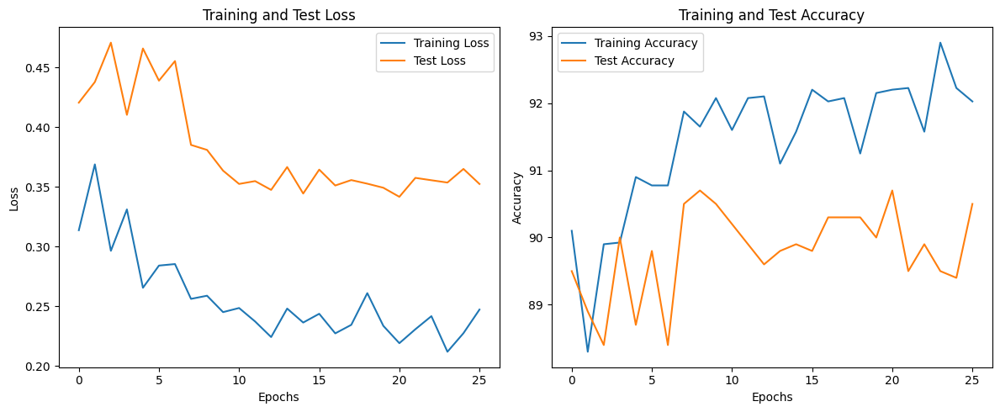

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

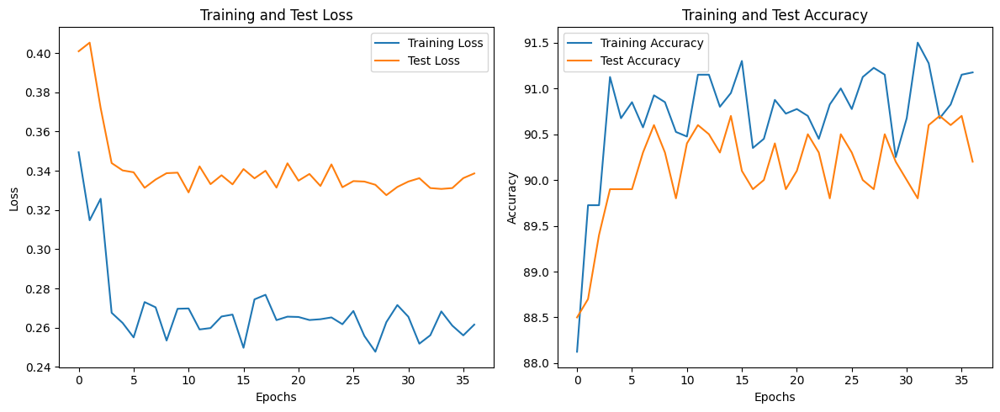

In [ ]:
# 绘制损失和准确率图
plt.figure(figsize=(12, 5))

# 绘制损失图
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()

# 绘制准确率图
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
torch.save(ensemble_model, '/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/best_ensemble_model.pth')

# evaluation

* confusion matrix

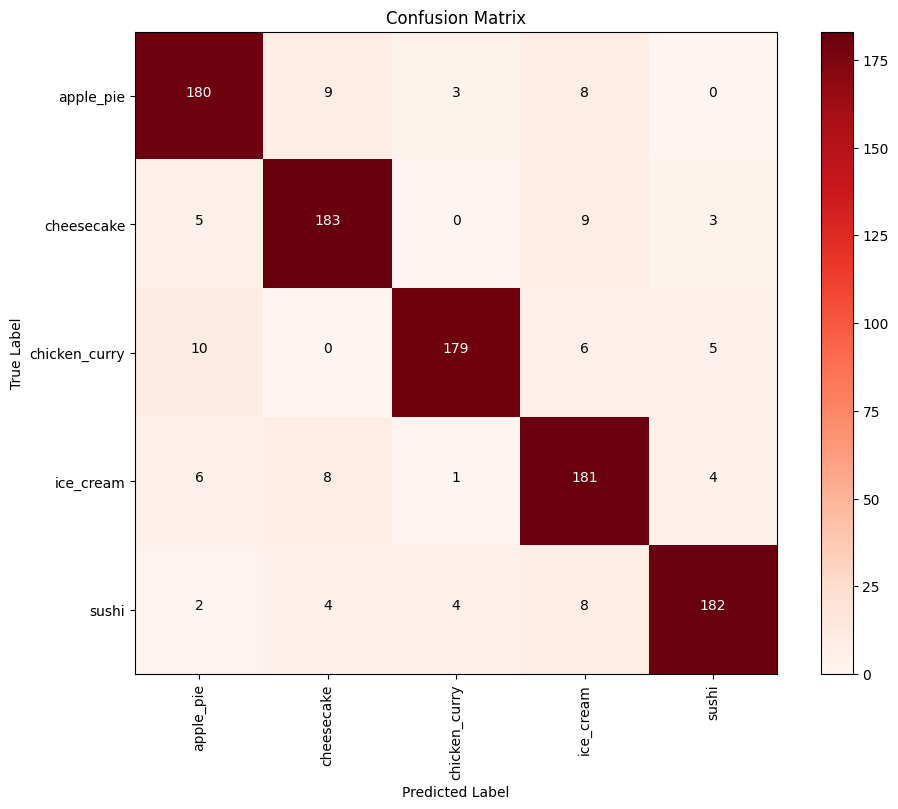

In [ ]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.metrics import confusion_matrix
from torchvision.models.inception import InceptionOutputs

def plot_confusion_matrix(model, test_loader, class_names):
    ensemble_model.eval()  # Set the model to evaluation mode
    device = next(ensemble_model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = ensemble_model(images)  # Perform forward pass to get predictions

            # Special handling for models that return multiple outputs like InceptionV3
            if isinstance(outputs, InceptionOutputs):
                outputs = outputs.logits  # Use only the main output if it's InceptionOutputs

            _, preds = torch.max(outputs, 1)  # Get predicted classes
            all_preds.extend(preds.cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    cm = confusion_matrix(all_labels, all_preds)  # Calculate confusion matrix

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap='Reds')
    plt.colorbar()

    ticks = np.arange(len(class_names))
    plt.xticks(ticks, class_names, rotation=90)
    plt.yticks(ticks, class_names)

    plt.title('Confusion Matrix')

    threshold = cm.max() / 2  # Update threshold for better text visibility
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:,}".format(cm[i, j]),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > threshold else 'black')

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

# Assuming 'class_names' is defined as your dataset classes
# Usage example
plot_confusion_matrix(ensemble_model, test_loader, class_names)
plt.show()




*   ROC Curve for Multi-Class Classification



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


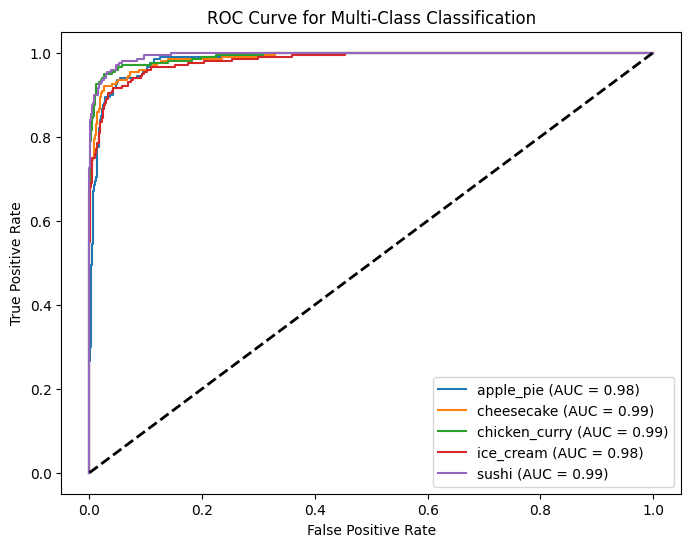

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import torch
num_classes = 5;

def generate_roc_curve(model, test_loader, class_names):
    num_classes = len(class_names)
    ensemble_model.eval()  # Set the model to evaluation mode
    device = next(ensemble_model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = ensemble_model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Multi-Class Classification')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `test_loader` previously
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, test_loader, and number of classes to generate ROC curves
generate_roc_curve(ensemble_model, test_loader, class_names)



*  Precision-Recall Curve for Multi-Class Classification



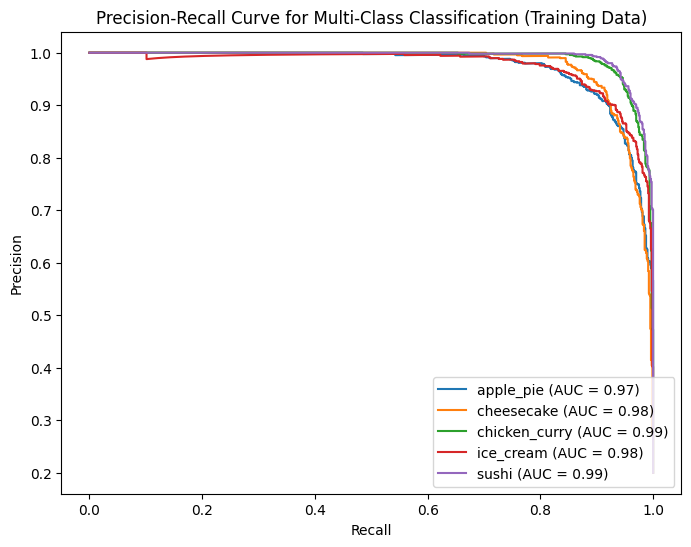

In [ ]:
def generate_precision_recall_curve_train(model, train_loader, class_names):
    num_classes = len(class_names)
    ensemble_model.eval()  # Set the model to evaluation mode
    device = next(ensemble_model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = ensemble_model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Compute precision and recall for each class
    precision = dict()
    recall = dict()
    pr_auc = dict()

    for i in range(num_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_true_one_hot[:, i], y_pred[:, i])
        pr_auc[i] = auc(recall[i], precision[i])

    # Plot Precision-Recall curves
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        plt.plot(recall[i], precision[i], label=f'{class_names[i]} (AUC = {pr_auc[i]:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve for Multi-Class Classification (Training Data)')
    plt.legend(loc='lower right')
    plt.show()

# Assuming you have defined `model` and `train_loader` for the training data
# Also assuming `num_classes` is defined as the number of classes in your dataset

# Usage: pass your PyTorch model, train_loader, and number of classes to generate Precision-Recall curves for training data
generate_precision_recall_curve_train(ensemble_model, train_loader, class_names)


指标

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(true_labels, predictions)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.45


In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score

precision = precision_score(true_labels, predictions, average='macro')
recall = recall_score(true_labels, predictions, average='macro')
f1 = f1_score(true_labels, predictions, average='macro')

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


Precision: 0.48
Recall: 0.45
F1 Score: 0.42


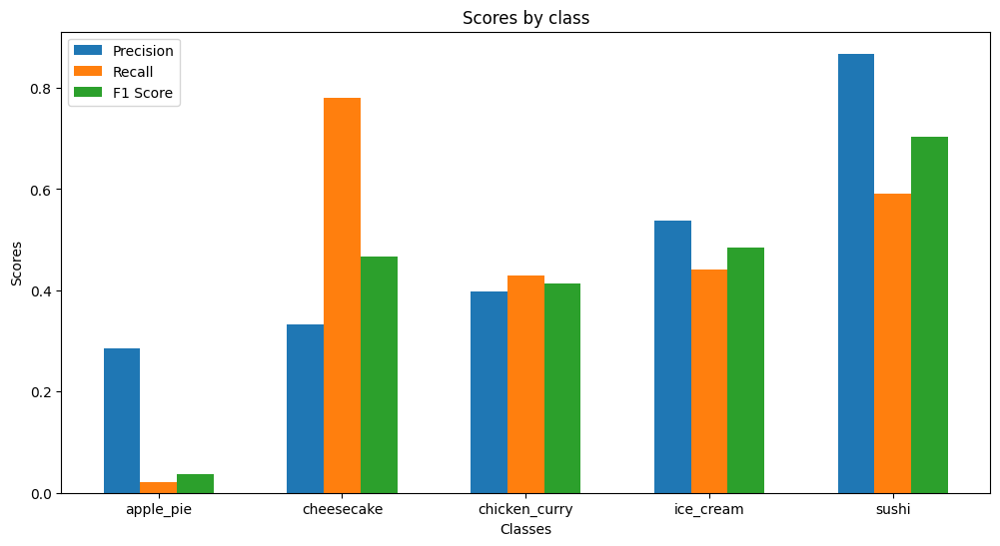

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have multiple classes in your classification task
class_labels = range(n_classes)

class_precision = precision_score(true_labels, predictions, average=None)
class_recall = recall_score(true_labels, predictions, average=None)
class_f1 = f1_score(true_labels, predictions, average=None)

# Plotting
x = np.arange(len(class_labels))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width, class_precision, width, label='Precision')
rects2 = ax.bar(x, class_recall, width, label='Recall')
rects3 = ax.bar(x + width, class_f1, width, label='F1 Score')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Classes')
ax.set_ylabel('Scores')
ax.set_title('Scores by class')
ax.set_xticks(x)
ax.set_xticklabels(class_names)
ax.legend()

plt.show()


* value of Acc     Pre     Sen     Spe      F1     mAP

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score, confusion_matrix
from sklearn.preprocessing import label_binarize
import torch
from tabulate import tabulate

def generate_metrics(model, test_loader, class_names):
    num_classes = len(class_names)
    model.eval()  # Set the model to evaluation mode
    device = next(model.parameters()).device  # Get the device the model is on

    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)  # Perform forward pass to get predictions
            all_preds.extend(torch.nn.functional.softmax(outputs, dim=1).cpu().numpy())  # Append predictions
            all_labels.extend(labels.cpu().numpy())  # Append labels

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)

    # Convert labels to one-hot encoding
    y_true_one_hot = label_binarize(y_true, classes=np.arange(num_classes))

    # Initialize metric containers
    metrics = []

    # Compute evaluation metrics for each class
    for i in range(num_classes):
        acc = accuracy_score(y_true_one_hot[:, i], y_pred[:, i] > 0.5)
        pre = precision_score(y_true_one_hot[:, i], y_pred[:, i] > 0.5)
        rec = recall_score(y_true_one_hot[:, i], y_pred[:, i] > 0.5)
        tn, fp, fn, tp = confusion_matrix(y_true_one_hot[:, i], y_pred[:, i] > 0.5).ravel()
        spe = tn / (tn + fp)
        f1 = f1_score(y_true_one_hot[:, i], y_pred[:, i] > 0.5)
        ap = average_precision_score(y_true_one_hot[:, i], y_pred[:, i])

        # Append metrics to the list
        metrics.append([class_names[i], acc, pre, rec, spe, f1, ap])

    # Create table headers
    headers = ['Class', 'Acc', 'Pre', 'Sen', 'Spe', 'F1', 'mAP']

    # Print the table
    print(tabulate(metrics, headers=headers, floatfmt=".4f"))

# Assuming you have defined `model` and `test_loader` previously
# Also assuming `class_names` is a list of class names
# Usage: pass your PyTorch model, test_loader, and class names to generate metrics
generate_metrics(model, test_loader, class_names)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Class             Acc     Pre     Sen     Spe      F1     mAP
-------------  ------  ------  ------  ------  ------  ------
apple_pie      0.9520  0.8585  0.9100  0.9625  0.8835  0.9423
cheesecake     0.9600  0.9124  0.8850  0.9788  0.8985  0.9623
chicken_curry  0.9740  0.9780  0.8900  0.9950  0.9319  0.9751
ice_cream      0.9530  0.9005  0.8600  0.9762  0.8798  0.9503
sushi          0.9730  0.9303  0.9350  0.9825  0.9327  0.9830


# Interpretability

In [ ]:
!pip install grad-cam torchcam

In [ ]:
!git clone https://github.com/jacobgil/pytorch-grad-cam.git

Cloning into 'pytorch-grad-cam'...
remote: Enumerating objects: 1168, done.
remote: Counting objects: 100% (70/70), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 1168 (delta 39), reused 30 (delta 17), pack-reused 1098
Receiving objects: 100% (1168/1168), 110.23 MiB | 12.23 MiB/s, done.
Resolving deltas: 100% (649/649), done.


In [ ]:
import pytorch_grad_cam

*  Grad-CAM

In [ ]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision.models import resnet50
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import torch

In [ ]:
from torchvision import transforms

test_transform = transforms.Compose([transforms.Resize(512),
                    transforms.ToTensor(),
                    transforms.Normalize(
                        mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
                  ])

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/test/cheesecake/1021942.jpg'

In [ ]:
img_pil = Image.open(img_path)

In [ ]:
input_tensor = test_transform(img_pil).unsqueeze(0).to(device)

In [ ]:
input_tensor.shape

torch.Size([1, 3, 512, 682])

In [ ]:
targets = [ClassifierOutputTarget(1)]

In [ ]:
model

In [ ]:
model.modelC.layer4[1]

BasicBlock(
  (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

In [ ]:
model.modelC.resnet.features[18]

Conv2dNormActivation(
  (0): Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (1): BatchNorm2d(1280, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU6(inplace=True)
)

In [ ]:
# Grad-CAM
from pytorch_grad_cam import GradCAM
target_layers = [model.modelC.layer4[1]]
cam = GradCAM(model=model, target_layers=target_layers)

In [ ]:
cam_map = cam(input_tensor=input_tensor, targets=targets)[0]

In [ ]:
cam_map.shape

(512, 682)

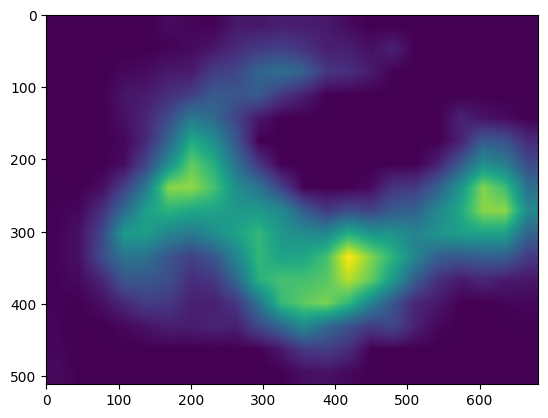

In [ ]:
plt.imshow(cam_map)
plt.show()

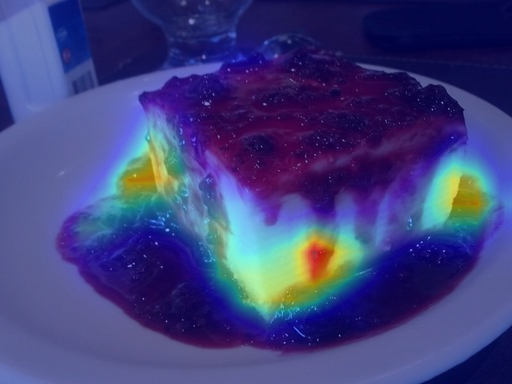

In [ ]:
import torchcam
from torchcam.utils import overlay_mask

result = overlay_mask(img_pil, Image.fromarray(cam_map), alpha=0.5)
result

* Guided Backpropagation

In [ ]:
from pytorch_grad_cam import GuidedBackpropReLUModel
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image


gb_model = GuidedBackpropReLUModel(model=model, device=device)

In [ ]:
gb_origin = gb_model(input_tensor, target_category=None)
gb_show = deprocess_image(gb_origin)

In [ ]:
gb_show.shape

(512, 682, 3)

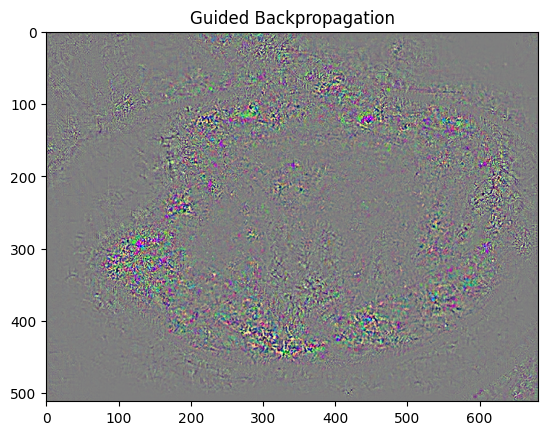

In [ ]:
plt.imshow(gb_show)
plt.title('Guided Backpropagation')
plt.show()

In [ ]:
cam_mask = cv2.merge([cam_map, cam_map, cam_map])
cam_mask.shape

(512, 682, 3)

In [ ]:
guided_gradcam = deprocess_image(cam_mask * gb_origin)
guided_gradcam.shape


(512, 682, 3)

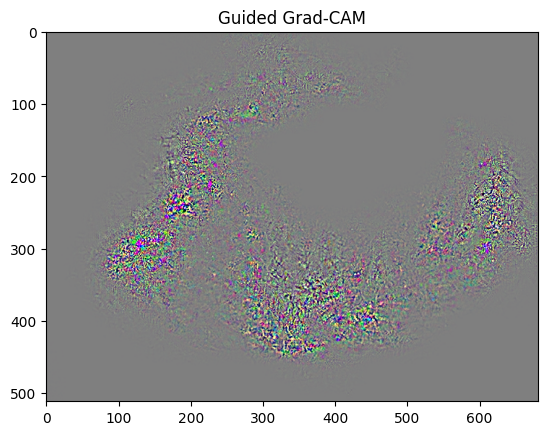

In [ ]:
plt.imshow(guided_gradcam)
plt.title('Guided Grad-CAM')
plt.show()

* SHAP

In [ ]:
!pip install numpy pandas matplotlib requests tqdm opencv-python pillow shap tensorflow keras -i https://pypi.tuna.tsinghua.edu.cn/simple

In [ ]:
import json
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import shap

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train/ice_cream/1004744.jpg'
img_pil = Image.open(img_path)
X = torch.Tensor(np.array(img_pil)).unsqueeze(0)
X.shape

torch.Size([1, 512, 384, 3])

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/Projects/datasets/Food Classification dataset_split/train/apple_pie/1272778.jpg'
img_pil = Image.open(img_path)
X = torch.Tensor(np.array(img_pil)).unsqueeze(0)
X.shape

torch.Size([1, 512, 512, 3])

In [ ]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def nhwc_to_nchw(x: torch.Tensor) -> torch.Tensor:
    if x.dim() == 4:
        x = x if x.shape[1] == 3 else x.permute(0, 3, 1, 2)
    elif x.dim() == 3:
        x = x if x.shape[0] == 3 else x.permute(2, 0, 1)
    return x

def nchw_to_nhwc(x: torch.Tensor) -> torch.Tensor:
    if x.dim() == 4:
        x = x if x.shape[3] == 3 else x.permute(0, 2, 3, 1)
    elif x.dim() == 3:
        x = x if x.shape[2] == 3 else x.permute(1, 2, 0)
    return x


transform= [
    transforms.Lambda(nhwc_to_nchw),
    transforms.Resize(224),
    transforms.Lambda(lambda x: x*(1/255)),
    transforms.Normalize(mean=mean, std=std),
    transforms.Lambda(nchw_to_nhwc),
]

inv_transform= [
    transforms.Lambda(nhwc_to_nchw),
    transforms.Normalize(
        mean = (-1 * np.array(mean) / np.array(std)).tolist(),
        std = (1 / np.array(std)).tolist()
    ),
    transforms.Lambda(nchw_to_nhwc),
]

transform = torchvision.transforms.Compose(transform)
inv_transform = torchvision.transforms.Compose(inv_transform)

In [ ]:
def predict(img: np.ndarray) -> torch.Tensor:
    img = nhwc_to_nchw(torch.Tensor(img)).to(device)
    output = model(img)
    return output
def predict(img):
    img = nhwc_to_nchw(torch.Tensor(img)).to(device)
    output = model(img)
    return output

In [ ]:
Xtr = transform(X)
out = predict(Xtr[0:1])
out.shape

torch.Size([1, 5])

In [ ]:
classes = torch.argmax(out, axis=1).detach().cpu().numpy()
print(f'Classes: {classes}: {np.array(class_names)[classes]}')

Classes: [0]: ['apple_pie']


In [ ]:
input_img = Xtr[0].unsqueeze(0)
input_img.shape

torch.Size([1, 224, 224, 3])

In [ ]:
batch_size = 50

n_evals = 5000 # 迭代次数越大，显著性分析粒度越精细，计算消耗时间越长

# 定义 mask，遮盖输入图像上的局部区域
masker_blur = shap.maskers.Image("blur(64, 64)", Xtr[0].shape)

# 创建可解释分析算法
explainer = shap.Explainer(predict, masker_blur, output_names=class_names)

In [ ]:
shap_values = explainer(input_img, max_evals=n_evals, batch_size=batch_size, outputs=[0,3])

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:35, 35.11s/it]               


In [ ]:
shap_values.data = inv_transform(shap_values.data).cpu().numpy()[0] # 原图
shap_values.values = [val for val in np.moveaxis(shap_values.values[0],-1, 0)] # shap值热力图

In [ ]:
shap_values.values[0].shape

(224, 224, 3)

In [ ]:
shap_values.values[0].shape

(224, 224, 3)

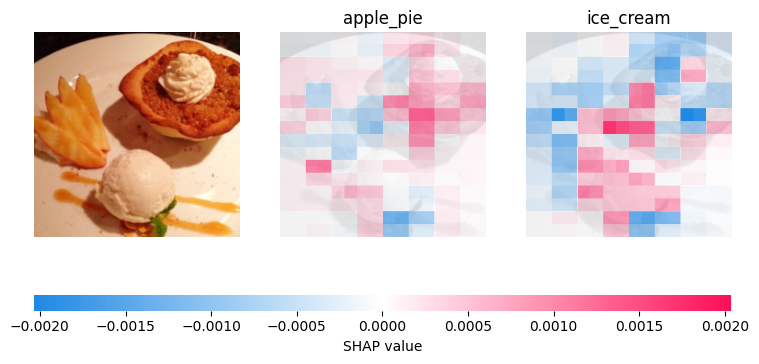

In [ ]:
shap.image_plot(shap_values=shap_values.values,
                pixel_values=shap_values.data,
                labels=shap_values.output_names)

* Lime

In [ ]:
!pip install lime scikit-learn numpy pandas matplotlib pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=f3f71f6c2a143bc6278c0b36165f359087873e764132be96d08be6945c3d0564
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn as nn
import numpy as np
import os, json

import torch
from torchvision import models, transforms
from torch.autograd import Variable
import torch.nn.functional as F

In [ ]:
len(idx_to_labels)

5

In [ ]:
trans_norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])

trans_A = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    trans_norm
    ])

trans_B = transforms.Compose([
        transforms.ToTensor(),
        trans_norm
    ])

trans_C = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224)
])

In [ ]:
input_tensor = trans_A(img_pil).unsqueeze(0).to(device)
pred_logits = model(input_tensor)
pred_softmax = F.softmax(pred_logits, dim=1)
top_n = pred_softmax.topk(5)

In [ ]:
top_n

torch.return_types.topk(
values=tensor([[1.0000e+00, 2.4213e-07, 1.7720e-07, 6.6463e-09, 6.2171e-12]],
       device='cuda:0', grad_fn=<TopkBackward0>),
indices=tensor([[1, 0, 3, 4, 2]], device='cuda:0'))

In [ ]:
def batch_predict(images):
    batch = torch.stack(tuple(trans_B(i) for i in images), dim=0)
    batch = batch.to(device)

    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

In [ ]:
test_pred = batch_predict([trans_C(img_pil)])
test_pred.squeeze().argmax()

0

In [ ]:
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(trans_C(img_pil)),
                                         batch_predict, # 分类预测函数
                                         top_labels=len(idx_to_labels),
                                         hide_color=0,
                                         num_samples=3000) # LIME生成的邻域图像个数

  0%|          | 0/3000 [00:00<?, ?it/s]

In [ ]:
explanation.top_labels[0]

0

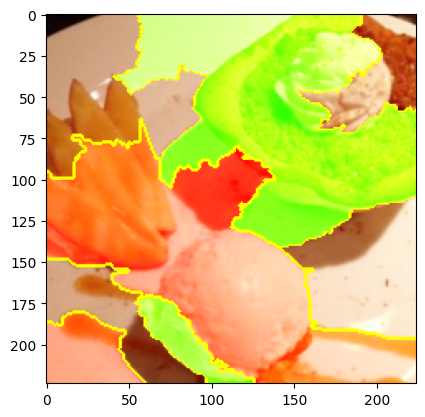

In [ ]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=20, hide_rest=False)
img_boundry = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry)
plt.show()

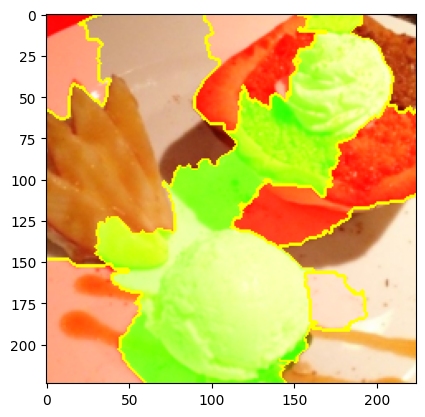

In [ ]:
temp, mask = explanation.get_image_and_mask(3, positive_only=False, num_features=20, hide_rest=False)
img_boundry = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry)
plt.show()

# ONNX

In [ ]:
!pip install onnx -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 2.7 MB/s eta 0:00:00


In [ ]:
!pip install onnxruntime -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 324.6 kB/s eta 0:00:00


In [ ]:
!pip install numpy pandas matplotlib tqdm opencv-python pillow -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [ ]:
import torch
print('PyTorch Version', torch.__version__)

PyTorch Version 2.2.1+cu121


In [ ]:
import onnx
print('ONNX Version', onnx.__version__)

ONNX Version 1.16.0


In [ ]:
import onnxruntime as ort
print('ONNX Runtime Version', ort.__version__)

ONNX Runtime Version 1.17.3


In [ ]:
import torch
from torchvision import models

# 有 GPU 就用 GPU，没有就用 CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


In [ ]:
model = torch.load('/content/drive/MyDrive/Colab Notebooks/Projects/checkpoint/best_ensemble_model.pth')
model = model.eval().to(device)

In [ ]:
x = torch.randn(1, 3, 256, 256).to(device)

In [ ]:
output = model(x)

In [ ]:
x

tensor([[[[ 0.1133, -0.4954, -1.4250,  ..., -0.2517, -0.7655,  0.8130],
          [-0.1907,  0.9373, -1.7813,  ..., -0.7574, -2.7707, -1.4311],
          [ 0.7416,  0.5929,  0.8135,  ..., -2.0498,  0.7444, -0.6798],
          ...,
          [ 0.0603,  1.2897,  0.8911,  ...,  0.1653, -0.7068,  0.2095],
          [-0.1958, -0.3998,  1.4766,  ..., -0.2310, -0.6284, -0.9419],
          [ 1.6459,  0.7866, -0.3018,  ...,  0.4191,  1.2232,  0.6568]],

         [[-0.5013,  1.2811,  0.7293,  ..., -0.3949,  0.3732, -0.2023],
          [ 0.6045,  0.4627, -1.3601,  ..., -1.4738, -0.1699, -0.9617],
          [-0.4339,  1.5086, -1.1727,  ..., -0.4984,  0.7156, -1.6996],
          ...,
          [ 0.3721, -1.2688, -0.9450,  ..., -1.8093,  0.4904, -0.3296],
          [ 0.0244,  0.3121,  2.0929,  ..., -0.3562,  0.9355, -0.1679],
          [-0.4715, -1.6612, -0.5194,  ..., -1.5059,  0.8763,  1.8805]],

         [[-0.4251,  0.8442,  1.4062,  ..., -1.8106,  0.5862, -1.4362],
          [-1.0610, -0.0535,  

In [ ]:
output.shape

torch.Size([1, 5])

In [ ]:
x = torch.randn(1, 3, 256, 256).to(device)

with torch.no_grad():
    torch.onnx.export(
        model,
        x,
        'ensemble_model.onnx',
        opset_version=11,
        input_names=['input'],
        output_names=['output']
    )

In [ ]:
import onnx

onnx_model = onnx.load('/content/ensemble_model.onnx')

onnx.checker.check_model(onnx_model)

print('No error, onnx model loaded successfully')

No error, onnx model loaded successfully


In [ ]:
print(onnx.helper.printable_graph(onnx_model.graph))

In [ ]:
target_directory = '/content/drive/MyDrive/Colab Notebooks/Projects/ONNX'
os.makedirs(target_directory, exist_ok=True)

source_path = '/content/ensemble_model.onnx'
target_path = f'{target_directory}/ensemble_model.onnx'

!mv "{source_path}" "{target_path}"

In [ ]:
x = torch.randn(1, 3, 256, 256).to(device)

with torch.no_grad():
    torch.onnx.export(
        loaded_inceptionv3_model,
        x,
        'inceptionv3_model.onnx',
        opset_version=11,
        input_names=['input'],
        output_names=['output']
    )

In [ ]:
import onnx

onnx_model = onnx.load('/content/inceptionv3_model.onnx')

onnx.checker.check_model(onnx_model)

print('No error, onnx model loaded successfully')

No error, onnx model loaded successfully


In [ ]:
print(onnx.helper.printable_graph(onnx_model.graph))

graph main_graph (
  %input[FLOAT, 1x3x256x256]
) initializers (
  %inceptionv3.fc.weight[FLOAT, 5x2048]
  %inceptionv3.fc.bias[FLOAT, 5]
  %onnx::Conv_913[FLOAT, 32x3x3x3]
  %onnx::Conv_914[FLOAT, 32]
  %onnx::Conv_916[FLOAT, 32x32x3x3]
  %onnx::Conv_917[FLOAT, 32]
  %onnx::Conv_919[FLOAT, 64x32x3x3]
  %onnx::Conv_920[FLOAT, 64]
  %onnx::Conv_922[FLOAT, 80x64x1x1]
  %onnx::Conv_923[FLOAT, 80]
  %onnx::Conv_925[FLOAT, 192x80x3x3]
  %onnx::Conv_926[FLOAT, 192]
  %onnx::Conv_928[FLOAT, 64x192x1x1]
  %onnx::Conv_929[FLOAT, 64]
  %onnx::Conv_931[FLOAT, 48x192x1x1]
  %onnx::Conv_932[FLOAT, 48]
  %onnx::Conv_934[FLOAT, 64x48x5x5]
  %onnx::Conv_935[FLOAT, 64]
  %onnx::Conv_937[FLOAT, 64x192x1x1]
  %onnx::Conv_938[FLOAT, 64]
  %onnx::Conv_940[FLOAT, 96x64x3x3]
  %onnx::Conv_941[FLOAT, 96]
  %onnx::Conv_943[FLOAT, 96x96x3x3]
  %onnx::Conv_944[FLOAT, 96]
  %onnx::Conv_946[FLOAT, 32x192x1x1]
  %onnx::Conv_947[FLOAT, 32]
  %onnx::Conv_949[FLOAT, 64x256x1x1]
  %onnx::Conv_950[FLOAT, 64]
  %onnx::Co